In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import mapclassify

In [2]:
def wf(x):
    return "/Users/andywang/desktop/Lab3/" + x
shp = gpd.read_file(wf("pc_MA_EE508.shp"))
d = pd.read_csv(wf("pc_MA_EE508.csv"))
shp_ma_outline = gpd.read_file(wf("MA_outline.shp"))

/var/folders/tk/v2hjsgjj3ysfqpw72wqmt1m40000gn/T/ipykernel_14366/3228652068.py:4: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  d = pd.read_csv(wf("pc_MA_EE508.csv"))


In [3]:
shp = shp.set_index('pid')
d = d.set_index('pid')

In [4]:
shp_c = shp.copy()
shp_c['geometry'] = shp_c['geometry'].centroid 

<Axes: >

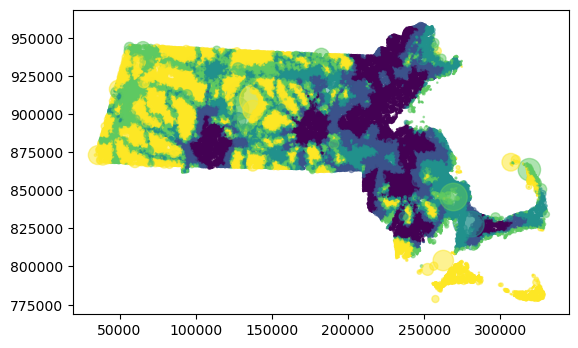

In [5]:
shp_c['ms'] = d['ha'] / 10
shp_c.join(d['travel']).plot(column='travel', markersize='ms', alpha=0.5, scheme = 'quantiles')

In [6]:
# Compute the change in percentage of parcel-level forest cover between 1990 and 2010
d['p_f_change'] = d['p_f_2010'] - d['p_f_1990']

# Compute the log of the per-hectare sale price of the last sale of the property
d['ls_price_per_ha_log'] = np.log(d['ls_price'] / d['ha'])

# Convert the 'ls_date' column to a datetime format and extract the year
d['ls_year'] = pd.to_datetime(d['ls_date']).dt.year

# Create a new variable 'p_e_ls' to represent the percentage of easement at the time of the last sale
# If 'e_year' is less than or equal to 'ls_year', use 'p_e'; otherwise, set it to 0
d['p_e_ls'] = np.where(d['e_year'] <= d['ls_year'], d['p_e'], 0)

# Normalize the building area to the parcel size
d['bld_area_per_ha'] = d['bld_area'] / d['ha']

In [7]:
# Define the list of predictor variables
XCOLS_LS = ['slope', 'travel', 'p_wet', 'coast_2500', 'river_frontage', 
            'lake_frontage', 'pop_dens_tract_2012-2016', 
            'hh_inc_avg_tract_2012-2016',
            'p_f_2000', 'p_prot_2000_500', 
            'p_d_2000_200', 'p_d_2000_1000', 'p_d_2000_5000',
            'p_dev_open', 'p_dev_low', 'p_dev_medium', 'p_dev_high', 
            'p_crops', 'p_pasture','p_grassland', 'bld_area_per_ha', 
            'ls_year']

# Create the X and y DataFrames/Series for last sale price prediction
X_ls = d[d['ls_year'] >= 2000][XCOLS_LS]  # Select data from 2000 and onward
y_ls = d[d['ls_year'] >= 2000]['ls_price_per_ha_log']  # Sale price per hectare with log transformation

In [8]:
# Define the list of predictor variables
XCOLS_FC = ['slope', 'travel', 'p_wet', 'coast_2500', 'river_frontage', 
            'lake_frontage',  'pop_dens_tract_2012-2016', 
            'hh_inc_avg_tract_2012-2016', 
            'p_f_1990', 'p_prot_1990_500', 
            'p_d_1990_200', 'p_d_1990_1000', 'p_d_1990_5000']

# Create the X and y DataFrames/Series for forest change probability estimation
X_fc = d[XCOLS_FC]  # All data without any time filter
y_fc = d['p_f_change']  # Change in percentage of forest cover from 1990 to 2010

In [9]:
# Define the selection criteria for X_ls and y_ls
i_ls = d[XCOLS_LS].isnull().sum(1).eq(0)
i_ls &= d['ls_year'].ge(2000)
i_ls &= d['ls_year'].le(2019)  # Sold between 2000 and 2019
i_ls &= d['p_e_ls'].eq(0)  # Not protected by an easement at the time of sale

# Select rows based on the criteria
X_ls = d.loc[i_ls, XCOLS_LS].copy()
y_ls = d.loc[i_ls, 'ls_price_per_ha_log'].copy()

# Convert 'ls_year' values to integers
X_ls['ls_year'] = X_ls['ls_year'].astype(int)

In [10]:
# Define the selection criteria for X_fc and y_fc
i_fc = d[XCOLS_FC].isnull().sum(1).eq(0)
i_fc &= d['p_prot'].le(5)  # Not protected (p_prot <= 5%)

# Select rows based on the criteria
X_fc = d.loc[i_fc, XCOLS_FC].copy()
y_fc = d.loc[i_fc, 'p_f_change'].copy()

In [11]:
import statsmodels.api as sm
model_ls_ols = sm.OLS(y_ls, sm.add_constant(X_ls)).fit()
model_ls_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.455
Model:                             OLS   Adj. R-squared:                  0.455
Method:                  Least Squares   F-statistic:                     1687.
Date:                 Thu, 14 Dec 2023   Prob (F-statistic):               0.00
Time:                         17:18:24   Log-Likelihood:                -78212.
No. Observations:                44424   AIC:                         1.565e+05
Df Residuals:                    44401   BIC:                         1.567e+05
Df Model:                           22                                         
Covariance Type:             nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -52.9732      2.823    -18.764      0.000     -58.507     -47.440
slope                         -0.0266      0.002    -10.791      0.000      -0.031      -0.022
travel                        -0.0006      0.000     -6.079      0.000      -0.001      -0.000
p_wet                         -0.0050      0.000    -24.097      0.000      -0.005      -0.005
coast_2500                     0.0298      0.001     29.846      0.000       0.028       0.032
river_frontage             -2.028e-05   7.75e-05     -0.262      0.794      -0.000       0.000
lake_frontage                 -0.0007   5.09e-05    -12.880      0.000      -0.001      -0.001
pop_dens_tract_2012-2016   -3.011e-05   1.99e-05     -1.511      0.131   -6.92e-05    8.94e-06
hh_inc_avg_tract_2012-2016  1.322e-05   1.88e-07     70.248      0.000    1.29e-05    1.36e-05
p_f_2000                      -0.0059      0.000    -16.005      0.000      -0.007      -0.005
p_prot_2000_500            -2.324e-05      0.001     -0.046      0.964      -0.001       0.001
p_d_2000_200                   0.0124      0.001     17.975      0.000       0.011       0.014
p_d_2000_1000                 -0.0002      0.001     -0.250      0.803      -0.002       0.002
p_d_2000_5000                  0.0154      0.001     16.528      0.000       0.014       0.017
p_dev_open                     0.0036      0.001      6.977      0.000       0.003       0.005
p_dev_low                      0.0075      0.001      9.104      0.000       0.006       0.009
p_dev_medium                   0.0150      0.001     20.060      0.000       0.013       0.016
p_dev_high                     0.0045      0.001      5.636      0.000       0.003       0.006
p_crops                       -0.0038      0.001     -4.302      0.000      -0.006      -0.002
p_pasture                     -0.0002      0.001     -0.382      0.702      -0.001       0.001
p_grassland                    0.0024      0.001      2.224      0.026       0.000       0.004
bld_area_per_ha              1.86e-05   6.64e-07     28.024      0.000    1.73e-05    1.99e-05
ls_year                        0.0315      0.001     22.385      0.000       0.029       0.034
==============================================================================
Omnibus:                     7448.307   Durbin-Watson:                   1.958
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34364.698
Skew:                          -0.752   Prob(JB):                         0.00
Kurtosis:                       7.038   Cond. No.                     4.82e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is 

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

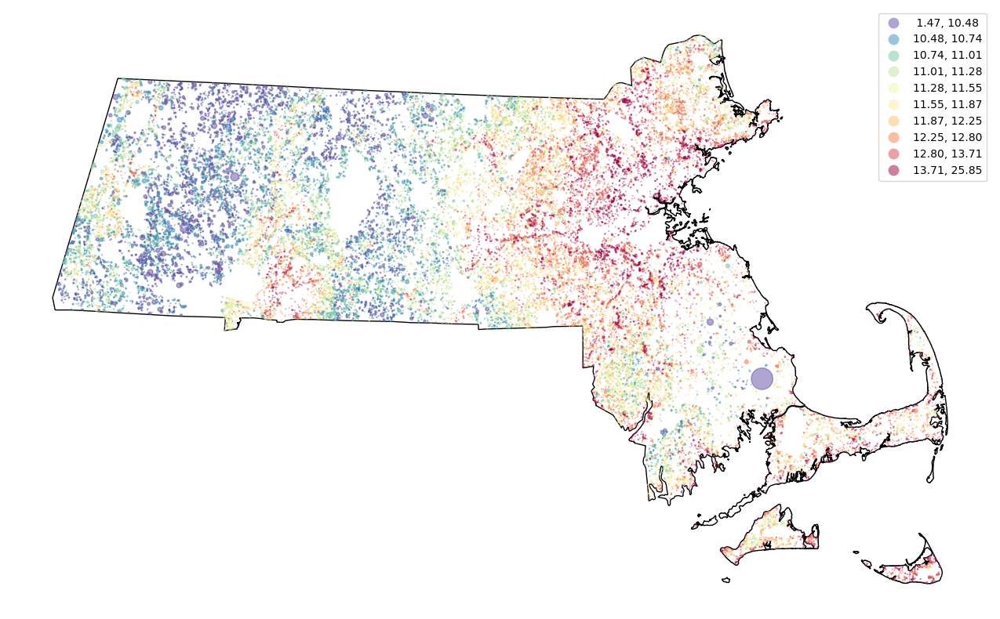

In [12]:
fig, ax = plt.subplots(figsize=(17, 10))
dp = shp_c.join(model_ls_ols.fittedvalues.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.axis('off')

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

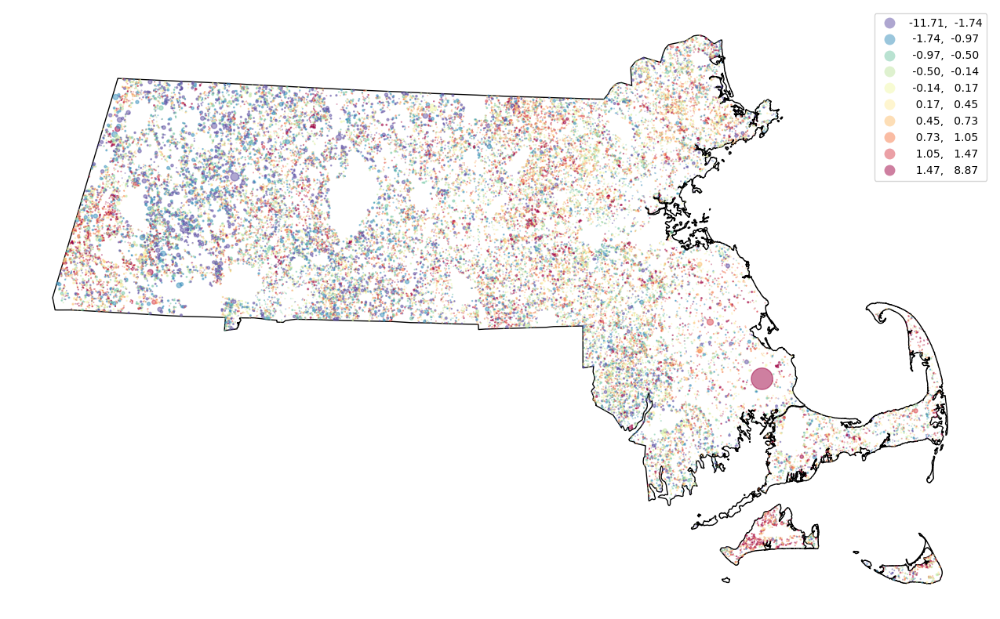

In [13]:
fig, ax = plt.subplots(figsize=(17, 10))
rp = shp_c.join(model_ls_ols.resid.rename('resid'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
rp.plot(
    'resid',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.axis('off')

<Axes: xlabel='ls_year'>

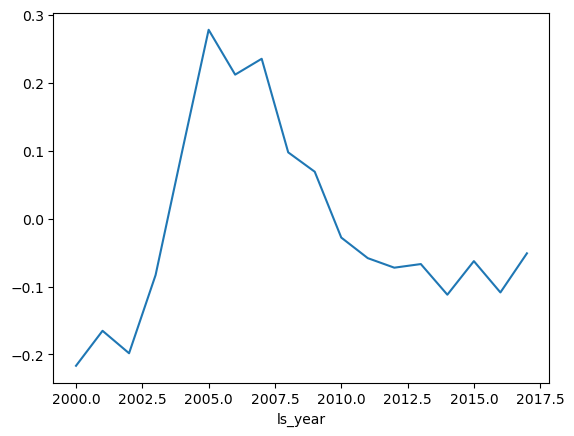

In [14]:
df = X_ls[['ls_year']].join(model_ls_ols.resid.rename('resid'))
df.groupby('ls_year')['resid'].mean().plot()

In [15]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_ls, model_ls_ols.fittedvalues)

1.980329829753318

In [16]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(categories='auto').fit(X_ls[['ls_year']])
dummies_array = enc.transform(X_ls[['ls_year']]).toarray()
dummies_df = pd.DataFrame(
    dummies_array,
    index=X_ls.index,
    columns=[v[8:] for v in enc.get_feature_names_out()],
)

In [17]:
X_ls2 = X_ls.drop(columns='ls_year').join(dummies_df).drop(columns='2000')

In [18]:
model_ls_ols2 = sm.OLS(y_ls, sm.add_constant(X_ls2)).fit()
model_ls_ols2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.462
Model:                             OLS   Adj. R-squared:                  0.461
Method:                  Least Squares   F-statistic:                     1002.
Date:                 Thu, 14 Dec 2023   Prob (F-statistic):               0.00
Time:                         17:18:31   Log-Likelihood:                -77948.
No. Observations:                44424   AIC:                         1.560e+05
Df Residuals:                    44385   BIC:                         1.563e+05
Df Model:                           38                                         
Covariance Type:             nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          9.7614      0.053    182.862      0.000       9.657       9.866
slope                         -0.0274      0.002    -11.177      0.000      -0.032      -0.023
travel                        -0.0007      0.000     -6.493      0.000      -0.001      -0.000
p_wet                         -0.0051      0.000    -24.486      0.000      -0.005      -0.005
coast_2500                     0.0300      0.001     30.207      0.000       0.028       0.032
river_frontage             -3.626e-05   7.71e-05     -0.471      0.638      -0.000       0.000
lake_frontage                 -0.0007   5.07e-05    -12.922      0.000      -0.001      -0.001
pop_dens_tract_2012-2016   -3.376e-05   1.98e-05     -1.704      0.088   -7.26e-05    5.08e-06
hh_inc_avg_tract_2012-2016  1.316e-05   1.87e-07     70.301      0.000    1.28e-05    1.35e-05
p_f_2000                      -0.0058      0.000    -16.027      0.000      -0.007      -0.005
p_prot_2000_500              8.67e-05      0.001      0.172      0.864      -0.001       0.001
p_d_2000_200                   0.0126      0.001     18.356      0.000       0.011       0.014
p_d_2000_1000                 -0.0004      0.001     -0.486      0.627      -0.002       0.001
p_d_2000_5000                  0.0155      0.001     16.736      0.000       0.014       0.017
p_dev_open                     0.0034      0.001      6.633      0.000       0.002       0.004
p_dev_low                      0.0073      0.001      9.010      0.000       0.006       0.009
p_dev_medium                   0.0146      0.001     19.662      0.000       0.013       0.016
p_dev_high                     0.0040      0.001      5.138      0.000       0.002       0.006
p_crops                       -0.0039      0.001     -4.439      0.000      -0.006      -0.002
p_pasture                     -0.0001      0.001     -0.253      0.801      -0.001       0.001
p_grassland                    0.0021      0.001      2.037      0.042    8.14e-05       0.004
bld_area_per_ha             1.866e-05    6.6e-07     28.272      0.000    1.74e-05       2e-05
2001                           0.0837      0.039      2.160      0.031       0.008       0.160
2002                           0.0817      0.038      2.152      0.031       0.007       0.156
2003                           0.2283      0.038      6.033      0.000       0.154       0.302
2004                           0.4424      0.037     12.035      0.000       0.370       0.514
2005                           0.6535      0.037     17.885      0.000       0.582       0.725
2006                           0.6194      0.037     16.565      0.000       0.546       0.693
2007                           0.6743      0.038     17.898      0.000       0.600       0.748
2008                           0

In [19]:
mean_squared_error(y_ls, model_ls_ols2.fittedvalues)

1.9570070916504736

<Axes: >

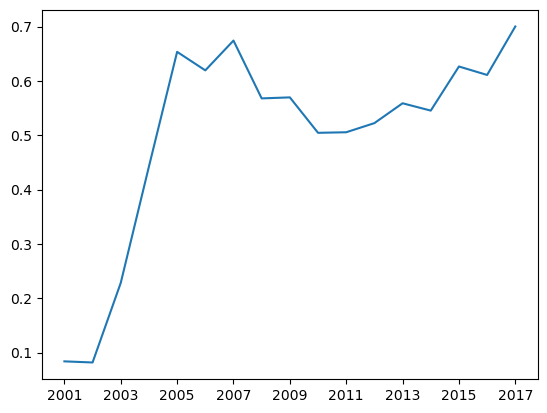

In [20]:
model_ls_ols2.params.loc['2001':'2017'].plot()

In [21]:
from itertools import combinations
X_ls3 = X_ls.drop(columns='ls_year').copy()
cols = X_ls3.columns
for v in cols:
    X_ls3[v + '^2'] = X_ls3[v] ** 2
for v1, v2 in combinations(cols,2):
    X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
X_ls3 = X_ls3.join(dummies_df)

/var/folders/tk/v2hjsgjj3ysfqpw72wqmt1m40000gn/T/ipykernel_14366/1670456788.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
/var/folders/tk/v2hjsgjj3ysfqpw72wqmt1m40000gn/T/ipykernel_14366/1670456788.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_ls3[v1 + '*' + v2] = X_ls3[v1] * X_ls3[v2]
/var/folders/tk/v2hjsgjj3ysfqpw72wqmt1m40000gn/T/ipykernel_14366/1670456788.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` 

In [22]:
model_ls_ols3 = sm.OLS(y_ls, sm.add_constant(X_ls3)).fit()
model_ls_ols3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ls_price_per_ha_log   R-squared:                       0.537
Model:                             OLS   Adj. R-squared:                  0.534
Method:                  Least Squares   F-statistic:                     190.2
Date:                 Thu, 14 Dec 2023   Prob (F-statistic):               0.00
Time:                         17:18:33   Log-Likelihood:                -74613.
No. Observations:                44424   AIC:                         1.498e+05
Df Residuals:                    44154   BIC:                         1.521e+05
Df Model:                          269                                         
Covariance Type:             nonrobust                                         
=======================================================================================================================
                                                          coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                   9.6012      0.191     50.254      0.000       9.227       9.976
slope                                                  -0.0174      0.020     -0.877      0.380      -0.056       0.021
travel                                                 -0.0016      0.001     -1.762      0.078      -0.003       0.000
p_wet                                                  -0.0138      0.001    -10.100      0.000      -0.016      -0.011
coast_2500                                              0.0679      0.009      7.977      0.000       0.051       0.085
river_frontage                                          0.0053      0.001      9.006      0.000       0.004       0.006
lake_frontage                                          -0.0021      0.000     -4.445      0.000      -0.003      -0.001
pop_dens_tract_2012-2016                                0.0009      0.000      4.706      0.000       0.001       0.001
hh_inc_avg_tract_2012-2016                           2.146e-05   1.42e-06     15.101      0.000    1.87e-05    2.42e-05
p_f_2000                                               -0.0146      0.003     -5.670      0.000      -0.020      -0.010
p_prot_2000_500                                         0.0017      0.004      0.484      0.629      -0.005       0.009
p_d_2000_200                                            0.0138      0.004      3.101      0.002       0.005       0.022
p_d_2000_1000                                           0.0258      0.006      4.535      0.000       0.015       0.037
p_d_2000_5000                                          -0.0066      0.006     -1.053      0.292      -0.019       0.006
p_dev_open                                              0.0025      0.003      0.817      0.414      -0.003       0.008
p_dev_low                                              -0.0023      0.005     -0.430      0.667      -0.013       0.008
p_dev_medium                                            0.0095      0.006      1.580      0.114      -0.002       0.021
p_dev_high                                             -0.0162      0.008     -1.902      0.057      -0.033       0.000
p_crops                                                 0.0026      0.007      0.348      0.728      -0.012       0.017
p_pasture                                              -0.0241      0.004     -6.016      0.000      -0.032      -0.016
p_grassland                                            -0.0202      0.007     -2.732      0.006      -0.035      -0.006
bld_area_per_ha                                      5.731e-05   5.32e-06     10.776      0.000    4.69e-05    6.77e-05
slope^2                                                 0.0009      0.00

In [23]:
mean_squared_error(y_ls, model_ls_ols3.fittedvalues)

1.6841173295590273

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

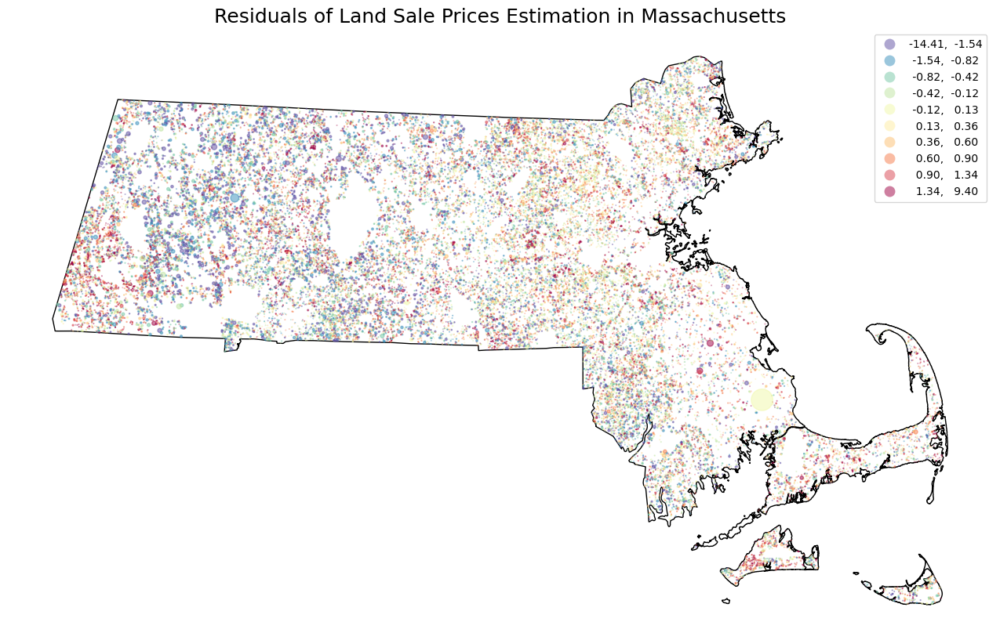

In [24]:
fig, ax = plt.subplots(figsize=(17, 10))
rp3 = shp_c.join(model_ls_ols3.resid.rename('resid'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
rp3.plot(
    'resid',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.set_title("Residuals of Land Sale Prices Estimation in Massachusetts", fontsize=18)

ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_ls_ols3_resid.png", dpi=200)

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

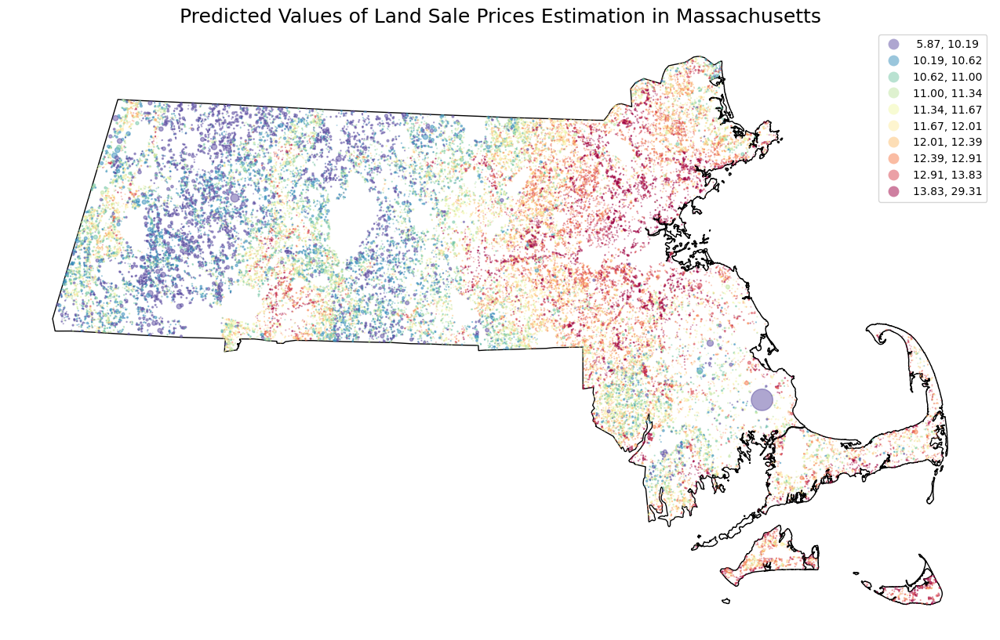

In [25]:
fig, ax = plt.subplots(figsize=(17, 10))
dp3 = shp_c.join(model_ls_ols3.fittedvalues.rename('pred'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp3.plot(
    'pred',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.set_title("Predicted Values of Land Sale Prices Estimation in Massachusetts", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_ls_ols3_pred.png", dpi=200)

In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import (
    ExtraTreesRegressor, 
    GradientBoostingRegressor, 
    RandomForestRegressor
)
from sklearn.model_selection import train_test_split, KFold

In [27]:
model = LinearRegression()
model.fit(X_ls, y_ls)

LinearRegression()

In [28]:
model.predict(X_ls)
mean_squared_error(y_ls, model.predict(X_ls))


1.980329829753318

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X_ls, y_ls, test_size=0.5)
model = LinearRegression()
model.fit(X_train, y_train)
mean_squared_error(y_test, model.predict(X_test))

2.011834891126498

In [30]:
X = X_ls
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = LinearRegression()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 1.9799
Avg MSE (out-of-sample): 1.984


In [31]:
X = X_ls2
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = LinearRegression()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 1.9565
Avg MSE (out-of-sample): 1.9621


In [32]:
X = X_ls3
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = LinearRegression()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 1.6781
Avg MSE (out-of-sample): 1.7686


In [33]:
X = X_ls
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = GradientBoostingRegressor()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 1.4143
Avg MSE (out-of-sample): 1.4732


In [34]:
X = X_ls
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = RandomForestRegressor(n_estimators=20)
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.2256
Avg MSE (out-of-sample): 1.4086


In [35]:
X = X_ls
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = ExtraTreesRegressor(n_estimators=50)
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.3451


<Axes: >

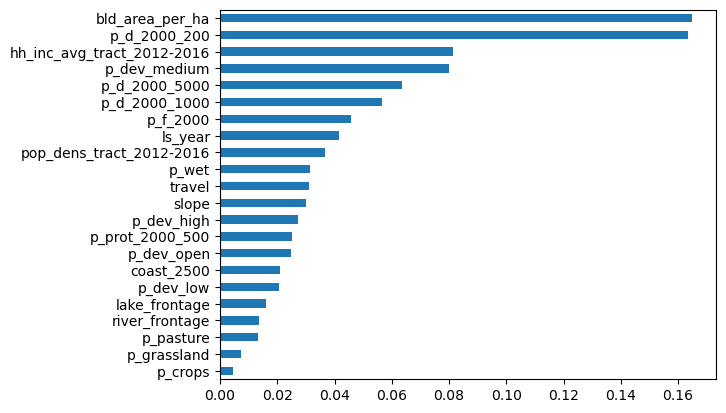

In [36]:
feat_imp = pd.Series(model.feature_importances_, index=X.columns)
feat_imp.sort_values().plot(kind='barh')

<Axes: >

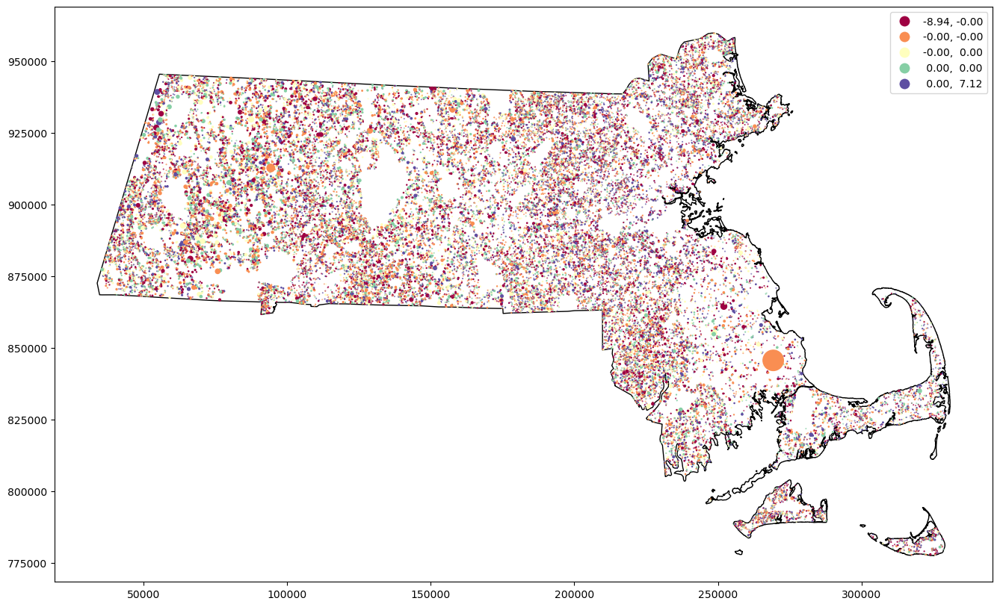

In [37]:
fig, ax = plt.subplots(figsize=(17, 10))
y_pred = pd.Series(model.predict(X), index=X.index)
resid = (y - y_pred).rename('resid')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p = shp_c.join(resid, how='inner')
shp_p.plot(
    'resid',
    ax=ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)

<Axes: >

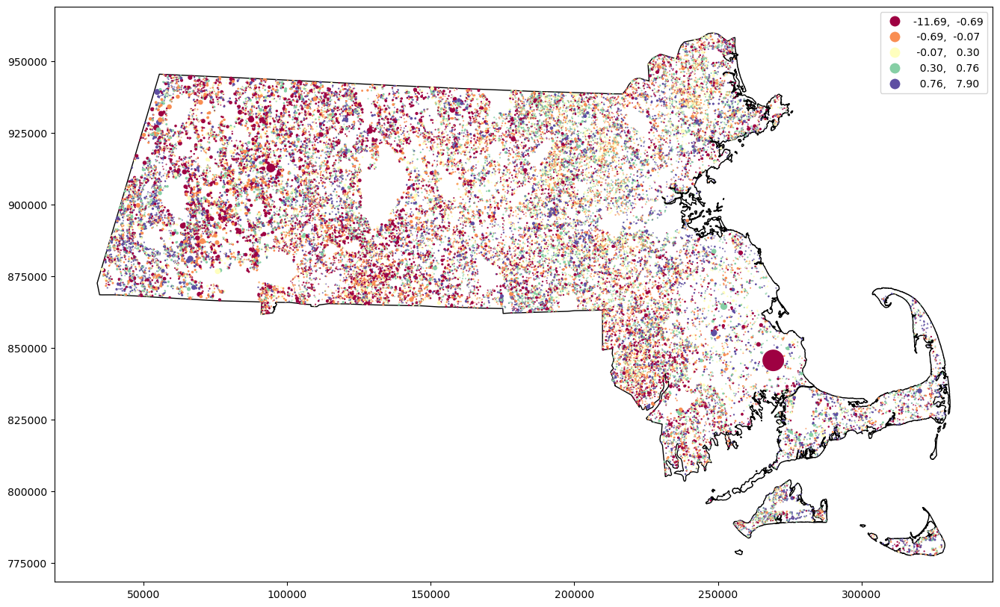

In [38]:
model = ExtraTreesRegressor(n_estimators=50, bootstrap=True, oob_score=True)
model.fit(X, y)
y_pred = pd.Series(model.oob_prediction_, index=X.index)
resid = (y - y_pred).rename('resid')
shp_p = shp_c.join(resid, how='inner')
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'resid',
    ax = ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)

<Axes: >

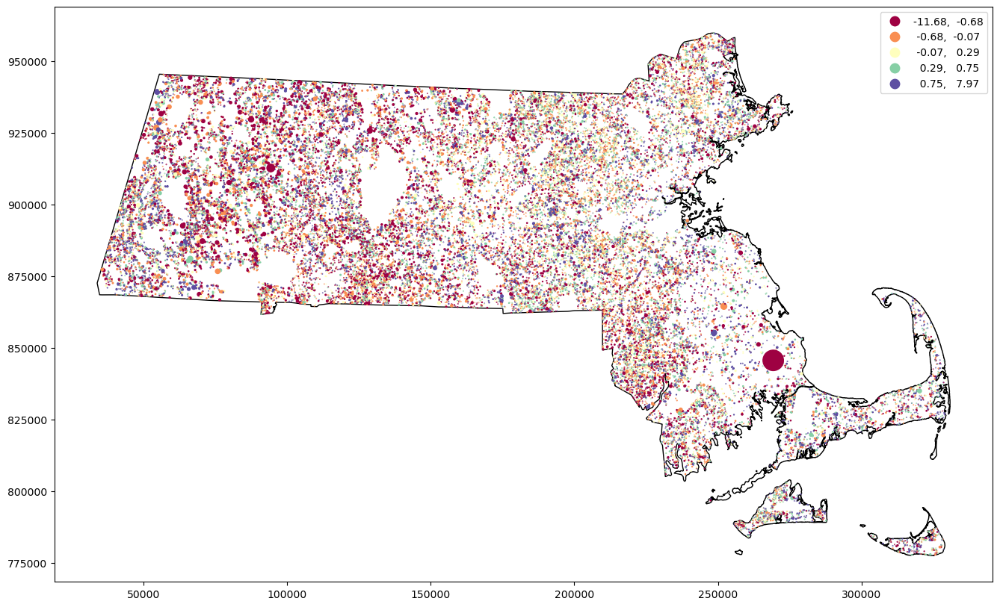

In [39]:
model = RandomForestRegressor(n_estimators=50, bootstrap=True, oob_score=True)
model.fit(X, y)
y_pred = pd.Series(model.oob_prediction_, index=X.index)
resid = (y - y_pred).rename('resid')
shp_p = shp_c.join(resid, how='inner')
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'resid',
    ax = ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)

In [40]:
shp_c['x'] = shp_c['geometry'].x
shp_c['y'] = shp_c['geometry'].y
coords = shp_c[['x', 'y']]

In [41]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = GradientBoostingRegressor()
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 1.37
Avg MSE (out-of-sample): 1.4342


In [42]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = RandomForestRegressor(n_estimators=20)
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.2167
Avg MSE (out-of-sample): 1.3695


In [43]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = ExtraTreesRegressor(n_estimators=50)
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.0
Avg MSE (out-of-sample): 1.283


In [44]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = GradientBoostingRegressor(n_estimators=1000)
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 1.0249
Avg MSE (out-of-sample): 1.3143


In [45]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = RandomForestRegressor(n_estimators=100, oob_score=True)
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1833
Avg MSE (out-of-sample): 1.3001


In [46]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = ExtraTreesRegressor(
        n_estimators=100, bootstrap=True, oob_score=True
    )
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1819
Avg MSE (out-of-sample): 1.2904


In [47]:
X = X_ls.join(coords)
y = y_ls
mse_train = []
mse_test = []
for i_train, i_test in KFold(n_splits=5, shuffle=True).split(X):
    X_train, X_test = X.iloc[i_train], X.iloc[i_test]
    y_train, y_test = y.iloc[i_train], y.iloc[i_test]
    model = ExtraTreesRegressor(
        n_estimators=250, bootstrap=True, oob_score=True, n_jobs=-1
    )
    model.fit(X_train, y_train)
    mse_train += [mean_squared_error(y_train, model.predict(X_train))]
    mse_test += [mean_squared_error(y_test, model.predict(X_test))]
print('Avg MSE (within-sample):', round(np.mean(mse_train), 4))
print('Avg MSE (out-of-sample):', round(np.mean(mse_test), 4))

Avg MSE (within-sample): 0.1767
Avg MSE (out-of-sample): 1.2843


In [48]:
xcols_ls_pred = [v for v in XCOLS_LS if v != 'ls_year']
i_ls_pred = d[xcols_ls_pred].isnull().sum(1).eq(0) & d['p_prot'].le(5)
X_ls_pred = d.loc[i_ls_pred, xcols_ls_pred]
X_ls_pred['ls_year'] = 2010

In [49]:
model_et_coords_250 = ExtraTreesRegressor(
    n_estimators=250, n_jobs=-1, bootstrap=True, oob_score=True
) 
model_et_coords_250.fit(X_ls.join(coords), y_ls)
y_pred_et_coords_250 = pd.Series(
    model_et_coords_250.predict(X_ls_pred.join(coords)), index=X_ls_pred.index
)

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

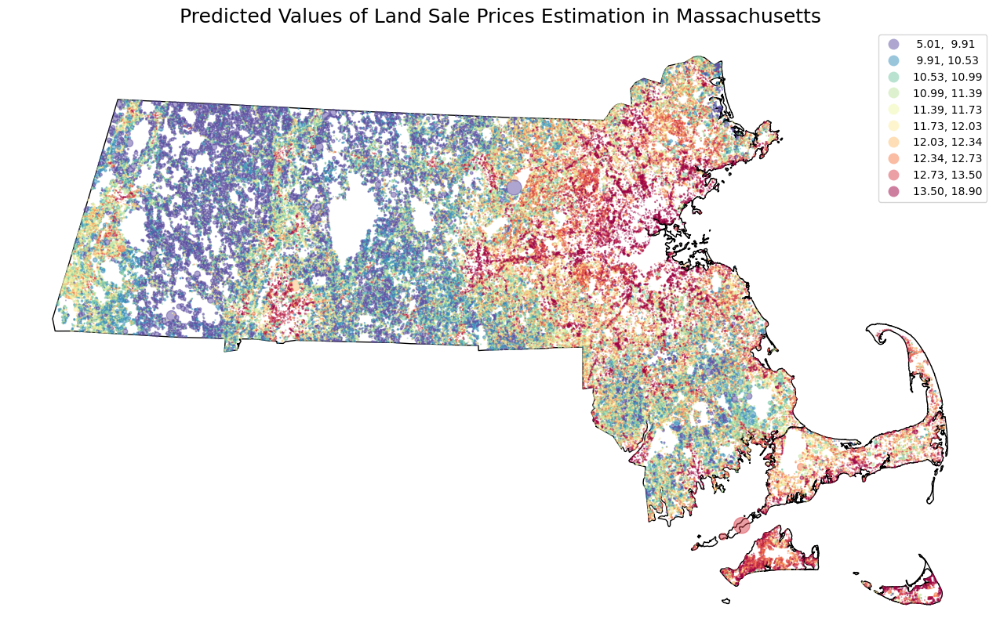

In [50]:
fig, ax = plt.subplots(figsize=(17, 10))
dp_et = shp_c.join(y_pred_et_coords_250.rename('pred1'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp_et.plot(
    'pred1',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.set_title("Predicted Values of Land Sale Prices Estimation in Massachusetts", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_ls_et_coords_250_pred.png", dpi=200)

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

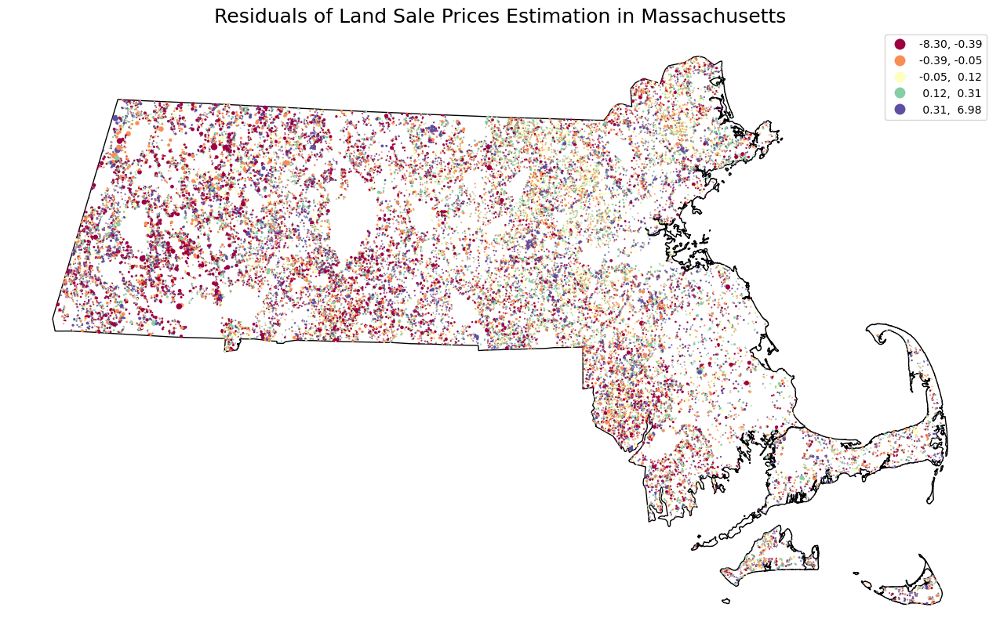

In [51]:
resid = (y - y_pred_et_coords_250).rename('resid')
shp_p = shp_c.join(resid, how='inner')
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'resid',
    ax = ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)
ax.set_title("Residuals of Land Sale Prices Estimation in Massachusetts", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_ls_et_coords_250_resid.png", dpi=200)

In [52]:
model_rf_coords_100 = RandomForestRegressor(
    n_estimators=100, n_jobs=-1, oob_score=True
) 
model_rf_coords_100.fit(X_ls.join(coords), y_ls)
y_pred_rf_coords_100 = pd.Series(
    model_rf_coords_100.predict(X_ls_pred.join(coords)), index=X_ls_pred.index
)


(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

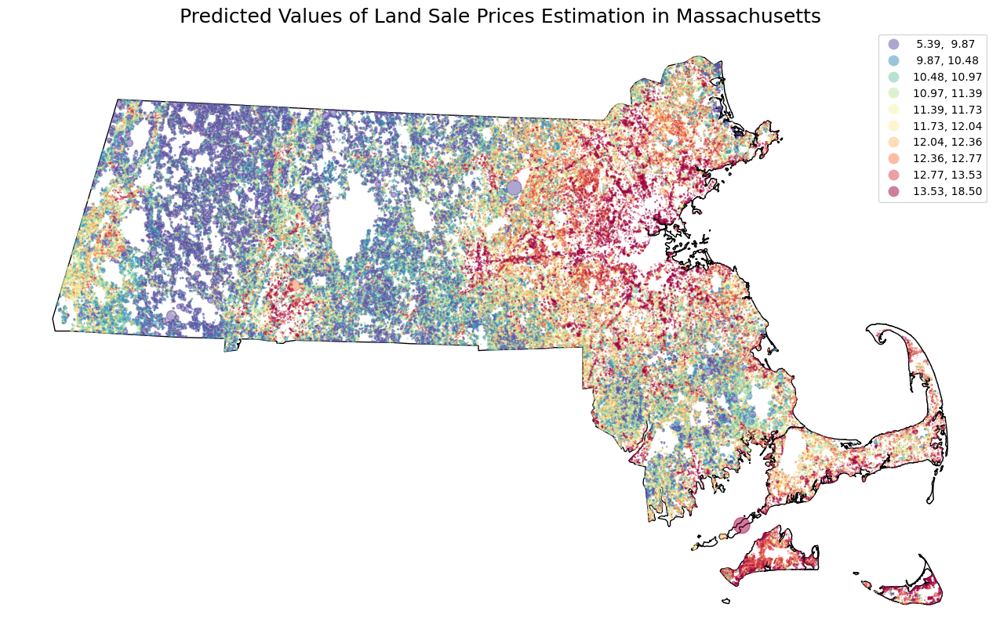

In [53]:
fig, ax = plt.subplots(figsize=(17, 10))
dp_rf = shp_c.join(y_pred_rf_coords_100.rename('pred2'), how='inner')
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp_rf.plot(
    'pred2',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral_r',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.set_title("Predicted Values of Land Sale Prices Estimation in Massachusetts", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_ls_rf_coords_100_pred.png", dpi=200)

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

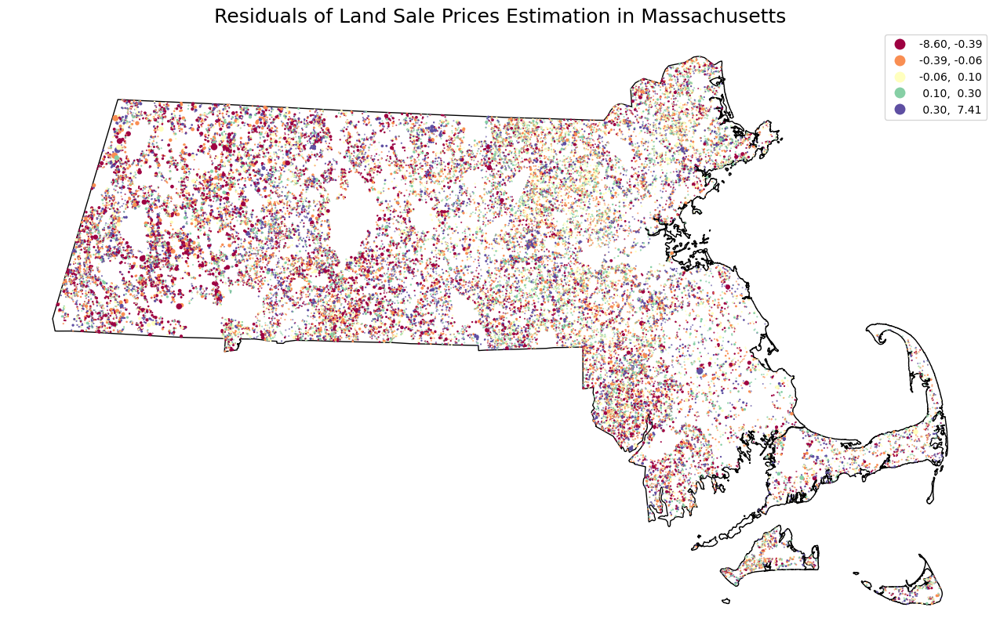

In [54]:
resid = (y - y_pred_rf_coords_100).rename('resid')
shp_p = shp_c.join(resid, how='inner')
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
shp_p.plot(
    'resid',
    ax = ax,
    markersize='ms',
    scheme='quantiles',
    legend=True,
    cmap='Spectral',
    figsize=(17, 10)
)
ax.set_title("Residuals of Land Sale Prices Estimation in Massachusetts", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_ls_rf_coords_100_resid.png", dpi=200)

In [55]:
xcols_fc_pred = [v for v in XCOLS_FC if v != 'fc_year']
i_fc_pred = d[xcols_fc_pred].isnull().sum(1).eq(0) & d['p_prot'].le(5)
X_fc_pred = d.loc[i_fc_pred, xcols_fc_pred]
model_fc_coords_250 = ExtraTreesRegressor(
    n_estimators=250, n_jobs=-1, bootstrap=True, oob_score=True
)
model_fc_coords_250.fit(X_fc.join(coords), y_fc)
y_pred_fc_coords_250 = pd.Series(
    model_fc_coords_250.predict(X_fc_pred.join(coords)), index=X_fc_pred.index
)

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

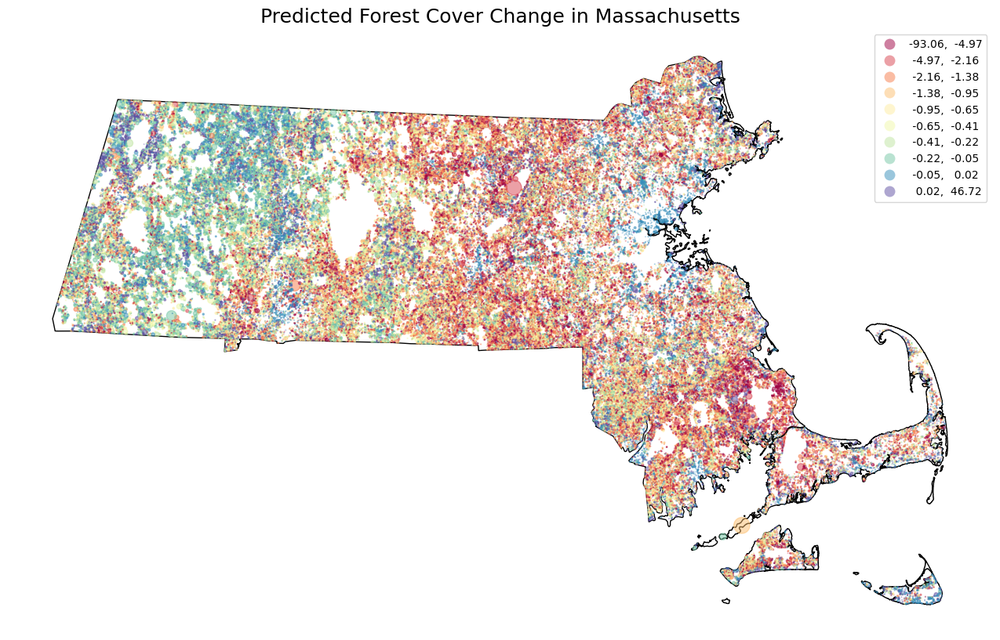

In [56]:
fig, ax = plt.subplots(figsize=(17, 10))
dp_fc = shp_c.join(y_pred_fc_coords_250.rename('pred3'), how='inner')

shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dp_fc.plot(
    'pred3',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral', 
    scheme='quantiles',
    k=10,
    legend=True
)
ax.set_title("Predicted Forest Cover Change in Massachusetts", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/1_fc_et_pred.png", dpi=200)

In [57]:
yp = pd.read_csv(wf("y_predictions.csv"))
yp = yp.set_index('pid')

In [58]:
dm = d.join(yp, how='inner')
dm

,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,hh_inc_med_tract_2012-2016,hh_inc_avg_bg_2012-2016,hh_inc_avg_tract_2012-2016,p_f_change,ls_price_per_ha_log,ls_year,p_e_ls,bld_area_per_ha,ls_pred,fc_pred
pid,,,,,,,,,,,,,,,,,,,,,
F_803174_3027860,25009,16250,1.138,3.269,8.000,0.0,0.000,0.0,0.0,0.000,...,98264.0,107637.264151,111868.256722,0,NaN,NaN,0.0,3124.780316,12.870125,-2.555327
M_238118_942044,25009,27620,3.052,6.315,14.000,10.0,0.000,0.0,0.0,0.000,...,96512.0,127585.099685,115417.941953,0,9.598621,1991.0,0.0,1471.821756,12.174028,-4.203807
M_240445_943056,25009,27620,2.165,2.538,20.000,48.0,0.000,0.0,0.0,0.000,...,96512.0,127585.099685,115417.941953,0,NaN,NaN,0.0,3155.196305,12.654431,-1.659536
M_245474_951109,25009,77150,2.162,1.784,19.000,21.0,7.000,0.0,0.0,0.000,...,138947.0,168559.326425,163715.534591,0,11.840504,2002.0,0.0,1055.504163,12.026018,0.174528
F_778757_3113679,25009,29405,7.070,7.645,8.000,4.0,4.133,0.0,0.0,0.000,...,72132.0,102680.276817,86602.895054,0,11.389646,2002.0,0.0,0.000000,10.537294,-2.453324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_74987_889210,25003,4545,89.442,9.172,41.429,7.0,0.000,0.0,381.2,148.681,...,72981.0,89094.137931,87422.722723,0,8.566898,2000.0,0.0,0.000000,8.879863,0.089586
F_182440_2984399,25003,53960,90.803,4.407,48.250,36.0,0.000,0.0,1836.0,3245.908,...,80388.0,88131.578947,94874.911482,0,NaN,NaN,0.0,0.000000,10.725508,-1.071956
M_74001_894053,25003,4545,95.959,7.229,152.000,31.0,0.000,0.0,1090.4,3458.145,...,72981.0,89094.137931,87422.722723,-1,NaN,NaN,0.0,23.843517,8.929642,-0.356848


In [59]:
dm['p_f_loss_pred_100yr'] = dm['fc_pred'].mul(-10).clip(upper=dm['p_f_2010'], lower=0)
dm['ha_f_loss_pred_100yr'] = dm['p_f_loss_pred_100yr'] * dm['ha'] / 100
dm['tco2_loss_pred_100yr'] = dm['ha_f_loss_pred_100yr'] * 400
dm['acq_cost_pred_usd'] = np.exp(dm['ls_pred']) * dm['ha']
dm['ce_cost_pred_usd'] = dm['acq_cost_pred_usd'] * 0.4
dm['ce_cost_$/tco2'] = dm['ce_cost_pred_usd'] / dm['tco2_loss_pred_100yr']

In [60]:
dm_filtered = dm[~dm['ce_cost_$/tco2'].isin([np.inf, -np.inf])]

(19014.26383461053, 345702.9467683639, 768457.3790219357, 968851.8563356873)

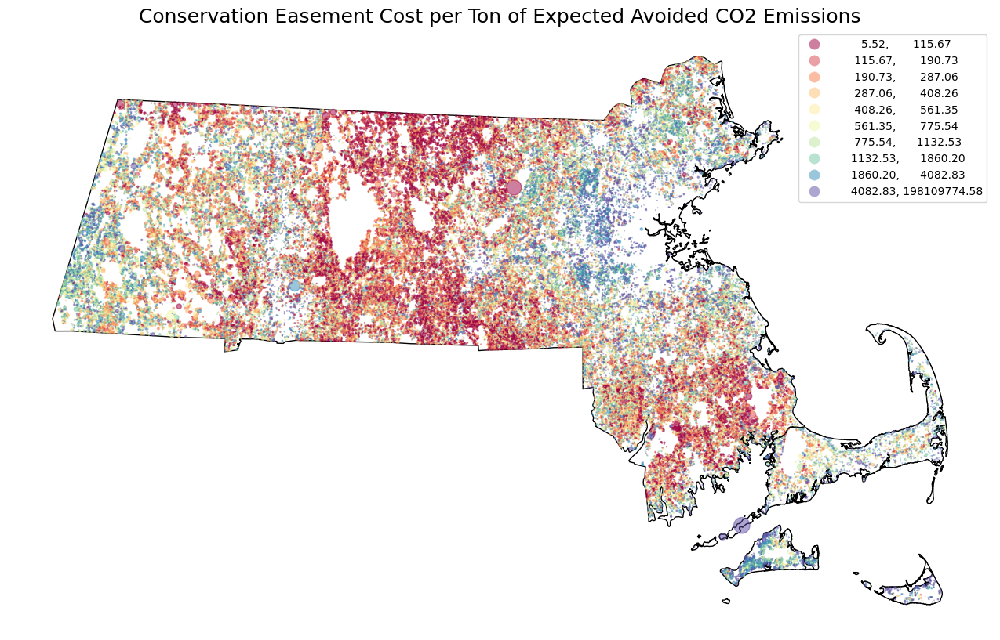

In [61]:
fig, ax = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax, color='none', edgecolor='black')
dm0 = shp_c.join(dm_filtered['ce_cost_$/tco2'].rename('avoidedCO2'), how='inner')
dm0.plot(
    'avoidedCO2',
    ax=ax,
    markersize='ms',
    alpha=0.5,
    cmap='Spectral',
    scheme='quantiles',
    k=10,
    legend=True
)
ax.set_title("Conservation Easement Cost per Ton of Expected Avoided CO2 Emissions", fontsize=18)
ax.axis('off')
#plt.savefig("/Users/andywang/desktop/2_ce_cost_usd_per_tco2.png", dpi=200)

In [62]:
dm_sorted = dm_filtered.sort_values(by='ce_cost_$/tco2')
dm_sorted['cum_tco2'] = dm_sorted['tco2_loss_pred_100yr'].cumsum()
dm_supply_curve = dm_sorted[dm_sorted['ce_cost_$/tco2'] <= 1000]
dm_sorted

,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,bld_area_per_ha,ls_pred,fc_pred,p_f_loss_pred_100yr,ha_f_loss_pred_100yr,tco2_loss_pred_100yr,acq_cost_pred_usd,ce_cost_pred_usd,ce_cost_$/tco2,cum_tco2
pid,,,,,,,,,,,,,,,,,,,,,
F_727177_2787269,25005,56375,4.738,0.629,22.0,5.0,0.0,0.0,0.0,0.000,...,0.000000,7.230578,-2.500678,25.006778,1.184821,473.928465,6.543278e+03,2.617311e+03,5.522587e+00,4.739285e+02
F_725608_2786151,25005,56375,2.373,1.725,22.0,6.0,0.0,0.0,0.0,0.000,...,0.000000,7.399235,-2.711937,27.119369,0.643543,257.417053,3.879222e+03,1.551689e+03,6.027917e+00,7.313455e+02
F_728494_2785591,25005,56375,1.495,1.300,42.0,0.0,0.0,0.0,0.0,0.000,...,0.000000,7.509981,-2.894286,28.942861,0.432696,173.078310,2.730136e+03,1.092054e+03,6.309598e+00,9.044238e+02
F_727322_2786475,25005,56375,2.578,1.041,22.0,32.0,0.0,0.0,0.0,0.000,...,0.000000,6.835246,-1.466861,14.668611,0.378157,151.262712,2.397686e+03,9.590746e+02,6.340456e+00,1.055687e+03
F_727190_2782144,25005,56375,1.657,1.097,12.0,2.0,0.0,0.0,0.0,0.000,...,0.000000,7.896622,-3.852843,38.528434,0.638416,255.366460,4.454324e+03,1.781730e+03,6.977148e+00,1.311053e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F_689217_3055697,25017,13135,1.198,0.600,5.5,13.0,0.0,0.0,0.0,0.000,...,16535.058431,14.083366,-0.001182,0.011822,0.000142,0.056649,1.565976e+06,6.263905e+05,1.105746e+07,5.778186e+07
M_120685_935014,25011,47835,1.155,0.000,42.0,48.0,0.0,155.6,0.0,0.000,...,0.000000,17.268920,-0.028356,0.283560,0.003275,1.310048,3.650722e+07,1.460289e+07,1.114683e+07,5.778186e+07
M_40312_885061,25003,21360,6.050,3.165,86.0,10.0,0.0,0.0,307.6,61.117,...,0.000000,11.641281,-0.000022,0.000215,0.000013,0.005206,6.878593e+05,2.751437e+05,5.285255e+07,5.778186e+07


Text(0, 0.5, 'Cost per Ton of Avoided CO2 ($/tCO2)')

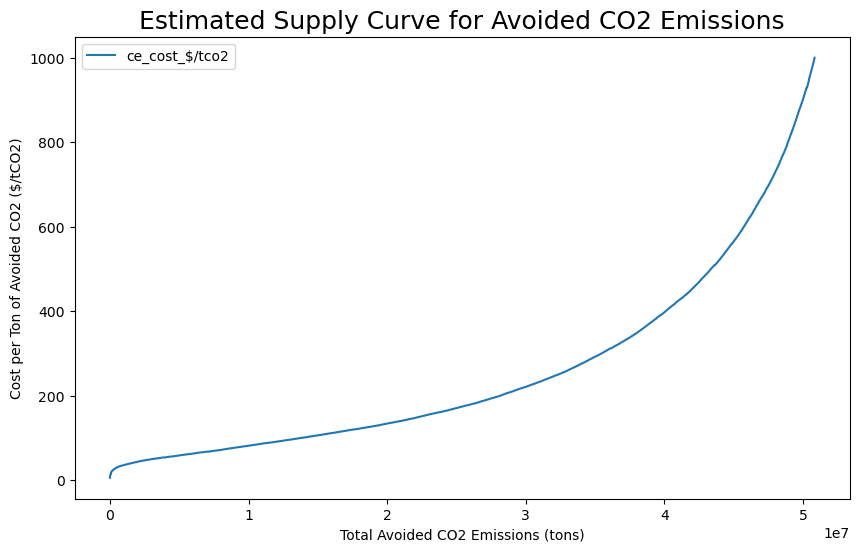

In [63]:
fig, ax = plt.subplots(figsize=(10, 6))
dm_supply_curve.plot('cum_tco2', 'ce_cost_$/tco2', ax=ax)
ax.set_title("Estimated Supply Curve for Avoided CO2 Emissions", fontsize=18)
ax.set_xlabel("Total Avoided CO2 Emissions (tons)")
ax.set_ylabel("Cost per Ton of Avoided CO2 ($/tCO2)")
#plt.savefig("/Users/andywang/desktop/2_tco2_supply_curve.png", dpi=200)

In [64]:
rggi_price = 13
scc_price = 51
uruguay_price = 135
def outcome_variables(dm, carbon_price):
    selected_parcels = dm[dm['ce_cost_$/tco2'] <= carbon_price]
    n = len(selected_parcels)
    ha_pc = selected_parcels['ha'].sum()
    ha_loss_avo = selected_parcels['ha_f_loss_pred_100yr'].sum()
    tco2_avo = selected_parcels['tco2_loss_pred_100yr'].sum()
    budget = selected_parcels['ce_cost_pred_usd'].sum()
    avg_usd_tco2 = budget / tco2_avo
    return n, ha_pc, ha_loss_avo, tco2_avo, budget, avg_usd_tco2
rggi_outcomes = outcome_variables(dm, rggi_price)
scc_outcomes = outcome_variables(dm, scc_price)
uruguay_outcomes = outcome_variables(dm, uruguay_price)

In [65]:
scenario_df = pd.DataFrame({
    'Scenario': [rggi_price, scc_price, uruguay_price],
    'n': [rggi_outcomes[0], scc_outcomes[0], uruguay_outcomes[0]],
    'ha_pc': [rggi_outcomes[1], scc_outcomes[1], uruguay_outcomes[1]],
    'ha_loss_avo': [rggi_outcomes[2], scc_outcomes[2], uruguay_outcomes[2]],
    'tco2_avo': [rggi_outcomes[3], scc_outcomes[3], uruguay_outcomes[3]],
    'budget': [rggi_outcomes[4], scc_outcomes[4], uruguay_outcomes[4]],
    'avg_usd_tco2': [rggi_outcomes[5], scc_outcomes[5], uruguay_outcomes[5]]
})
#scenario_df.to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False)


In [66]:
BUDGET=70000000
dm_sorted = dm.sort_values(by='ce_cost_$/tco2')
dm_sorted['ce_cost_pred_usd_sum'] = dm_sorted['ce_cost_pred_usd'].cumsum()
i_scenario_1 = dm_sorted['ce_cost_pred_usd_sum'].lt(BUDGET)
selected_parcels_scenario_1 = dm_sorted[i_scenario_1]

In [67]:
n_scenario_1 = len(selected_parcels_scenario_1)
ha_pc_scenario_1 = selected_parcels_scenario_1['ha'].sum()
ha_loss_avo_scenario_1 = selected_parcels_scenario_1['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_1 = selected_parcels_scenario_1['tco2_loss_pred_100yr'].sum()
budget_scenario_1 = selected_parcels_scenario_1['ce_cost_pred_usd'].sum()
avg_usd_tco2_scenario_1 = budget_scenario_1 / tco2_avo_scenario_1

In [68]:
scenario_1_values = {
    'Scenario': 'Scenario 1',
    'n': n_scenario_1,
    'ha_pc': ha_pc_scenario_1,
    'ha_loss_avo': ha_loss_avo_scenario_1,
    'tco2_avo': tco2_avo_scenario_1,
    'budget': budget_scenario_1,
    'avg_usd_tco2': avg_usd_tco2_scenario_1
}
#pd.DataFrame([scenario_1_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

Text(0.5, 1.0, 'Scenario 1')

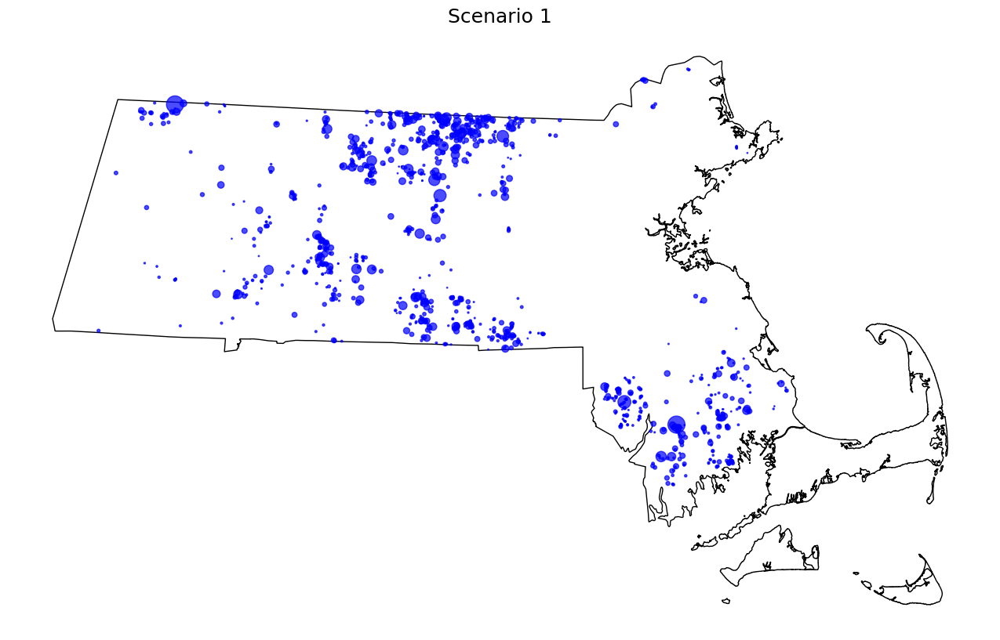

In [69]:
fig1, ax1 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax1, color='none', edgecolor='black')
selected_parcels_scenario_1_gdf = shp_c.join(selected_parcels_scenario_1, on='pid')
selected_parcels_scenario_1_gdf.plot(ax=ax1, markersize='ha', color='blue', alpha=0.7)
ax1.axis('off')
ax1.set_title("Scenario 1", fontsize=18)
#plt.savefig("/Users/andywang/desktop/2_selected_parcels_scenario_1.png", dpi=200)

In [70]:
dm2010 = dm[dm['p_f_2010']>0]
dm_sorted2 = dm2010.sort_values(by='fc_pred')
dm_sorted2['ce_cost_pred_usd_sum'] = dm_sorted2['ce_cost_pred_usd'].cumsum()
i_scenario_2 = dm_sorted2['ce_cost_pred_usd_sum'].lt(BUDGET)
selected_parcels_scenario_2 = dm_sorted2[i_scenario_2]

In [71]:
n_scenario_2 = len(selected_parcels_scenario_2)
ha_pc_scenario_2 = selected_parcels_scenario_2['ha'].sum()
ha_loss_avo_scenario_2 = selected_parcels_scenario_2['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_2 = selected_parcels_scenario_2['tco2_loss_pred_100yr'].sum()
budget_scenario_2 = selected_parcels_scenario_2['ce_cost_pred_usd'].sum()
avg_usd_tco2_scenario_2 = budget_scenario_2 / tco2_avo_scenario_2
scenario_2_values = {
    'Scenario': 'Scenario 2',
    'n': n_scenario_2,
    'ha_pc': ha_pc_scenario_2,
    'ha_loss_avo': ha_loss_avo_scenario_2,
    'tco2_avo': tco2_avo_scenario_2,
    'budget': budget_scenario_2,
    'avg_usd_tco2': avg_usd_tco2_scenario_2
}
#pd.DataFrame([scenario_2_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

Text(0.5, 1.0, 'Scenario 2')

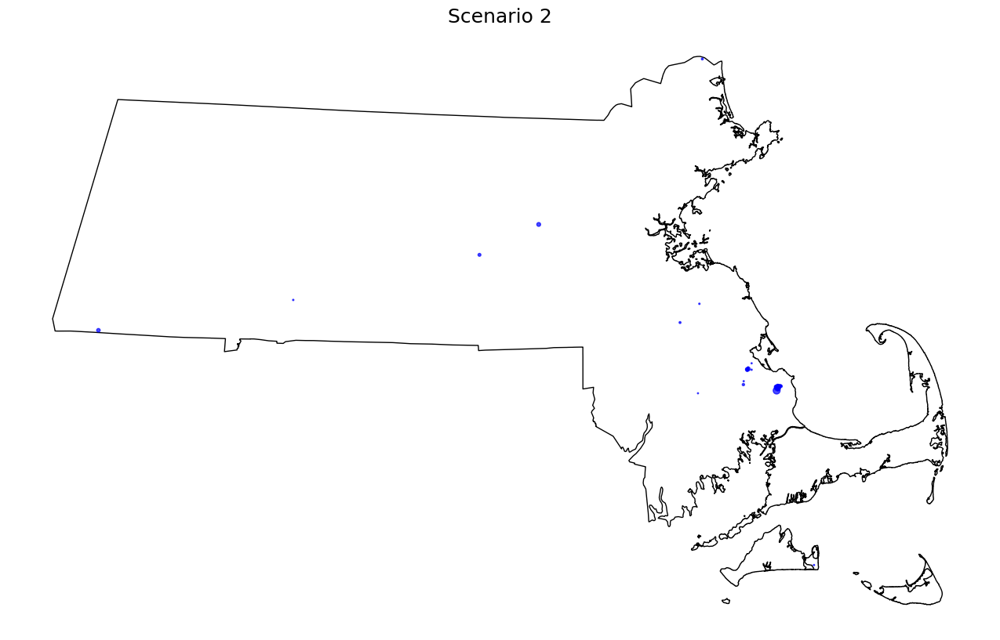

In [72]:
fig2, ax2 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax2, color='none', edgecolor='black')
selected_parcels_scenario_2_gdf = shp_c.join(selected_parcels_scenario_2, on='pid')
selected_parcels_scenario_2_gdf.plot(ax=ax2, markersize='ha', color='blue', alpha=0.7)
ax2.axis('off')
ax2.set_title("Scenario 2", fontsize=18)
#plt.savefig("/Users/andywang/desktop/2_selected_parcels_scenario_2.png", dpi=200)

In [91]:
dm['offer3'] = dm['p_f_2010']/100 * dm['ha'] * 2680
i_scenario_3 = dm['ce_cost_pred_usd'] < dm['offer3']
dm[i_scenario_3]['offer3'].sum()
selected_parcels_scenario_3 = dm[i_scenario_3]
dm['offer3']

pid
F_803174_3027860      1402.9264
M_238118_942044       7933.9792
M_240445_943056       3423.2980
M_245474_951109          0.0000
F_778757_3113679     18758.1240
                       ...     
M_74987_889210      232513.4232
F_182440_2984399     82739.6936
M_74001_894053      218594.6020
M_67459_886161      238781.4876
F_172467_2984485     70913.7380
Name: offer3, Length: 177277, dtype: float64

In [74]:
n_scenario_3 = len(selected_parcels_scenario_3)
ha_pc_scenario_3 = selected_parcels_scenario_3['ha'].sum()
ha_loss_avo_scenario_3 = selected_parcels_scenario_3['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_3 = selected_parcels_scenario_3['tco2_loss_pred_100yr'].sum()
budget_scenario_3 = dm[i_scenario_3]['offer3'].sum()
avg_usd_tco2_scenario_3 = budget_scenario_3 / tco2_avo_scenario_3
scenario_3_values = {
    'Scenario': 'Scenario 3',
    'n': n_scenario_3,
    'ha_pc': ha_pc_scenario_3,
    'ha_loss_avo': ha_loss_avo_scenario_3,
    'tco2_avo': tco2_avo_scenario_3,
    'budget': budget_scenario_3,
    'avg_usd_tco2': avg_usd_tco2_scenario_3
}
#pd.DataFrame([scenario_3_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

Text(0.5, 1.0, 'Scenario 3')

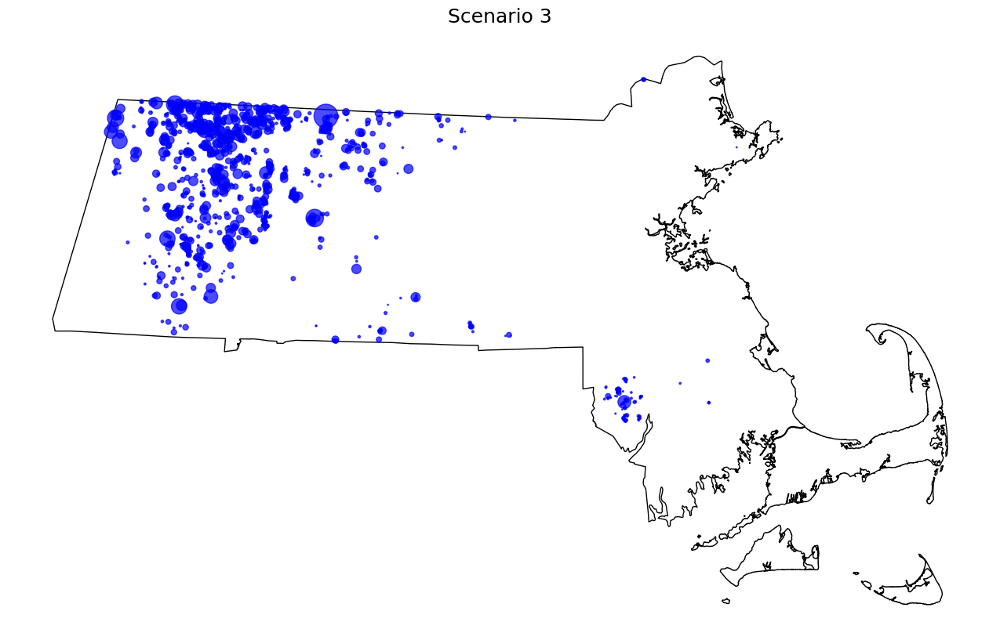

In [75]:
fig3, ax3 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax3, color='none', edgecolor='black')
selected_parcels_scenario_3_gdf = shp_c.join(selected_parcels_scenario_3, on='pid')
selected_parcels_scenario_3_gdf.plot(ax=ax3, markersize='ha', color='blue', alpha=0.7)
ax3.axis('off')
ax3.set_title("Scenario 3", fontsize=18)
#plt.savefig("/Users/andywang/desktop/2_selected_parcels_scenario_3.png", dpi=200)

In [76]:
dm['offer4']= dm['tco2_loss_pred_100yr'] *41
i_scenario_4 = dm['ce_cost_pred_usd'] < dm['offer4']
dm[i_scenario_4]['offer4'].sum()
selected_parcels_scenario_4 = dm[i_scenario_4]

In [104]:
n_scenario_4 = len(selected_parcels_scenario_4)
ha_pc_scenario_4 = selected_parcels_scenario_4['ha'].sum()
ha_loss_avo_scenario_4 = selected_parcels_scenario_4['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_4 = selected_parcels_scenario_4['tco2_loss_pred_100yr'].sum()
budget_scenario_4 = dm[i_scenario_4]['offer4'].sum()
avg_usd_tco2_scenario_4 = budget_scenario_4 / tco2_avo_scenario_4
scenario_4_values = {
    'Scenario': 'Scenario 4',
    'n': n_scenario_4,
    'ha_pc': ha_pc_scenario_4,
    'ha_loss_avo': ha_loss_avo_scenario_4,
    'tco2_avo': tco2_avo_scenario_4,
    'budget': budget_scenario_4,
    'avg_usd_tco2': avg_usd_tco2_scenario_4
}
#pd.DataFrame([scenario_4_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

Text(0.5, 1.0, 'Scenario 4')

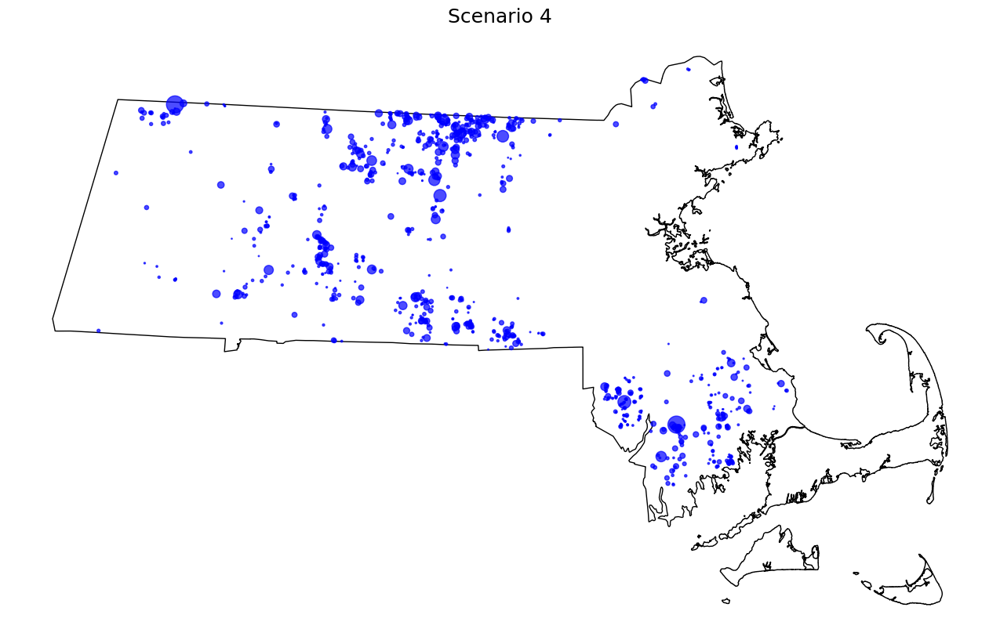

In [78]:
fig4, ax4 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax4, color='none', edgecolor='black')
selected_parcels_scenario_4_gdf = shp_c.join(selected_parcels_scenario_4, on='pid')
selected_parcels_scenario_4_gdf.plot(ax=ax4, markersize='ha', color='blue', alpha=0.7)
ax4.axis('off')
ax4.set_title("Scenario 4", fontsize=18)
#plt.savefig("/Users/andywang/desktop/2_selected_parcels_scenario_4.png", dpi=200)

In [79]:
transaction_cost_per_parcel = 45000
dm['tc'] = transaction_cost_per_parcel
dm['tc+ce_cost_pred_usd'] = (dm['ce_cost_pred_usd']+dm['tc'])
dm['tc+ce_cost_$/tco2'] = (dm['tc+ce_cost_pred_usd'] / dm['tco2_loss_pred_100yr'])
dm['ce_cost_pred_usd_sum_with_transaction'] = (dm['tc+ce_cost_pred_usd']).cumsum()
dm_sorted5 = dm.sort_values(by='tc+ce_cost_$/tco2')
dm_sorted5

,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,tco2_loss_pred_100yr,acq_cost_pred_usd,ce_cost_pred_usd,ce_cost_$/tco2,offer3,offer4,tc,tc+ce_cost_pred_usd,tc+ce_cost_$/tco2,ce_cost_pred_usd_sum_with_transaction
pid,,,,,,,,,,,,,,,,,,,,,
F_354523_3074640,25011,35285,26.969,11.842,125.00,0.0,0.0,0.0,162.0,11.252,...,8050.989018,2.485530e+05,99421.213240,12.348944,68663.0740,330090.549737,45000,144421.213240,17.938319,4.168910e+10
M_183328_915554,25027,34165,29.479,3.284,64.25,31.0,0.0,360.0,890.8,306.000,...,9807.050489,3.424065e+05,136962.585638,13.965727,75053.5340,402089.070054,45000,181962.585638,18.554262,5.810776e+10
F_518568_2860349,25027,63345,28.102,4.145,29.00,39.0,0.0,0.0,0.0,0.000,...,9667.088000,3.491053e+05,139642.130123,14.445108,64769.4896,396350.608000,45000,184642.130123,19.100078,5.676355e+10
F_401884_2970006,25015,52560,15.180,9.100,125.00,0.0,0.0,0.0,0.0,0.000,...,5004.677643,1.431493e+05,57259.701524,11.441237,40682.4000,205191.783353,45000,102259.701524,20.432825,4.652155e+10
F_506066_2886601,25027,68155,71.482,6.060,54.75,22.0,0.0,0.0,0.0,0.000,...,3351.532904,1.079113e+05,43164.514806,12.879037,189656.0424,137412.849083,45000,88164.514806,26.305729,5.684580e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_139321_889963,25015,72880,2.359,6.500,27.50,148.0,0.0,426.0,0.0,0.000,...,0.000000,1.289157e+06,515662.866323,inf,2212.7420,0.000000,45000,560662.866323,inf,4.597590e+10
M_244856_915772,25009,37490,2.013,7.229,1.00,0.0,0.0,0.0,0.0,0.000,...,0.000000,1.589957e+06,635982.937821,inf,0.0000,0.000000,45000,680982.937821,inf,4.897034e+09
M_240297_934723,25009,7420,1.074,0.864,58.00,0.0,0.0,0.0,0.0,0.000,...,0.000000,3.828205e+05,153128.200192,inf,0.0000,0.000000,45000,198128.200192,inf,4.896196e+09


In [80]:
i_scenario_5 = dm_sorted5['ce_cost_pred_usd_sum_with_transaction'].lt(BUDGET)
selected_parcels_scenario_5 = dm_sorted5[i_scenario_5]
n_scenario_5 = len(selected_parcels_scenario_5)
ha_pc_scenario_5 = selected_parcels_scenario_5['ha'].sum()
ha_loss_avo_scenario_5 = selected_parcels_scenario_5['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_5 = selected_parcels_scenario_5['tco2_loss_pred_100yr'].sum()
budget_scenario_5 = selected_parcels_scenario_5['tc+ce_cost_pred_usd'].sum()
avg_usd_tco2_scenario_5 = budget_scenario_5 / tco2_avo_scenario_5

scenario_5_values = {
    'Scenario': 'Scenario 5',
    'n': n_scenario_5,
    'ha_pc': ha_pc_scenario_5,
    'ha_loss_avo': ha_loss_avo_scenario_5,
    'tco2_avo': tco2_avo_scenario_5,
    'budget': budget_scenario_5,
    'avg_usd_tco2': avg_usd_tco2_scenario_5
}
#pd.DataFrame([scenario_5_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

Text(0.5, 1.0, 'Scenario 5')

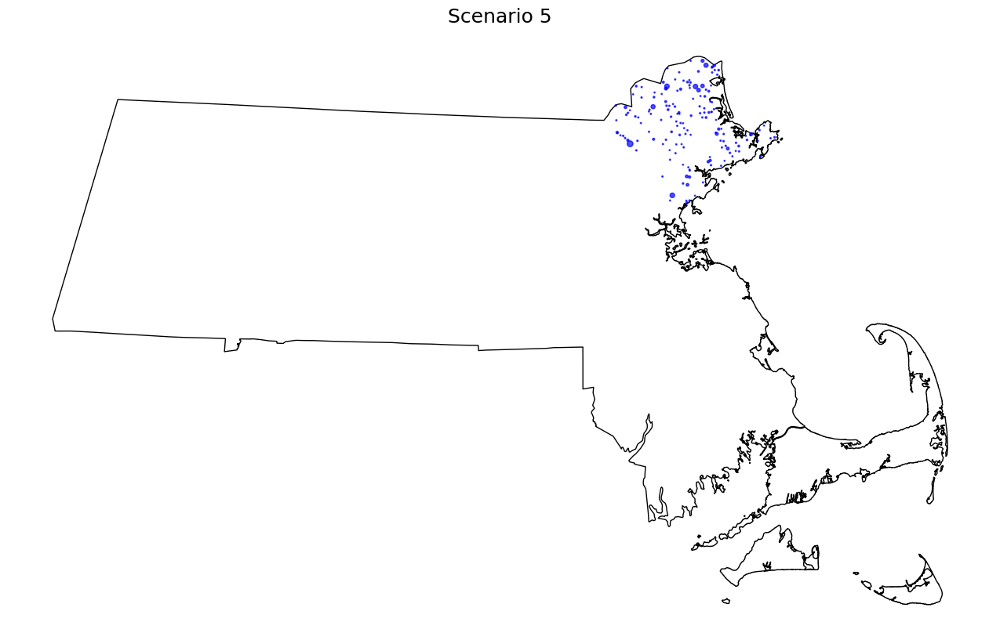

In [81]:
fig5, ax5 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax5, color='none', edgecolor='black')
selected_parcels_scenario_5_gdf = shp_c.join(selected_parcels_scenario_5, on='pid')
selected_parcels_scenario_5_gdf.plot(ax=ax5, markersize='ha', color='blue', alpha=0.7)
ax5.axis('off')
ax5.set_title("Scenario 5", fontsize=18)
#plt.savefig("/Users/andywang/desktop/2_selected_parcels_scenario_5.png", dpi=200)

In [82]:
random_noise = np.random.normal(scale=0.25, size=len(dm))
dm['ls_pred_wta'] = dm['ls_pred'] + random_noise + 0.1
dm['wta_ce_cost_pred_usd'] = np.exp(dm['ls_pred_wta']) * dm['ha'] * 0.4
dm_wta = dm[dm['wta_ce_cost_pred_usd'] < dm['ce_cost_pred_usd']]
dm_wta_sorted = dm_wta.sort_values(by='ce_cost_$/tco2')
dm_wta_sorted['ce_cost_pred_usd_sum'] = dm_wta_sorted['ce_cost_pred_usd'].cumsum()
i_scenario_6 = dm_wta_sorted['ce_cost_pred_usd_sum'].lt(BUDGET)

In [83]:
selected_parcels_scenario_6 = dm_wta_sorted[i_scenario_6]
n_scenario_6 = len(selected_parcels_scenario_6)
ha_pc_scenario_6 = selected_parcels_scenario_6['ha'].sum()
ha_loss_avo_scenario_6 = selected_parcels_scenario_6['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_6 = selected_parcels_scenario_6['tco2_loss_pred_100yr'].sum()
budget_scenario_6 = selected_parcels_scenario_6['ce_cost_pred_usd'].sum()
avg_usd_tco2_scenario_6 = budget_scenario_6 / tco2_avo_scenario_6

scenario_6_values = {
    'Scenario': 'Scenario 6',
    'n': n_scenario_6,
    'ha_pc': ha_pc_scenario_6,
    'ha_loss_avo': ha_loss_avo_scenario_6,
    'tco2_avo': tco2_avo_scenario_6,
    'budget': budget_scenario_6,
    'avg_usd_tco2': avg_usd_tco2_scenario_6
}
#pd.DataFrame([scenario_6_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

In [84]:
n_scenario_6 = len(selected_parcels_scenario_6)
ha_pc_scenario_6 = selected_parcels_scenario_6['ha'].sum()
ha_loss_avo_scenario_6 = selected_parcels_scenario_6['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_6 = selected_parcels_scenario_6['tco2_loss_pred_100yr'].sum()
budget_scenario_6 = selected_parcels_scenario_6['ce_cost_pred_usd'].sum()
avg_usd_tco2_scenario_6 = budget_scenario_6 / tco2_avo_scenario_6

scenario_6_values = {
    'Scenario': 'Scenario 6',
    'n': n_scenario_6,
    'ha_pc': ha_pc_scenario_6,
    'ha_loss_avo': ha_loss_avo_scenario_6,
    'tco2_avo': tco2_avo_scenario_6,
    'budget': budget_scenario_6,
    'avg_usd_tco2': avg_usd_tco2_scenario_6
}
#pd.DataFrame([scenario_6_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

Text(0.5, 1.0, 'Scenario 6')

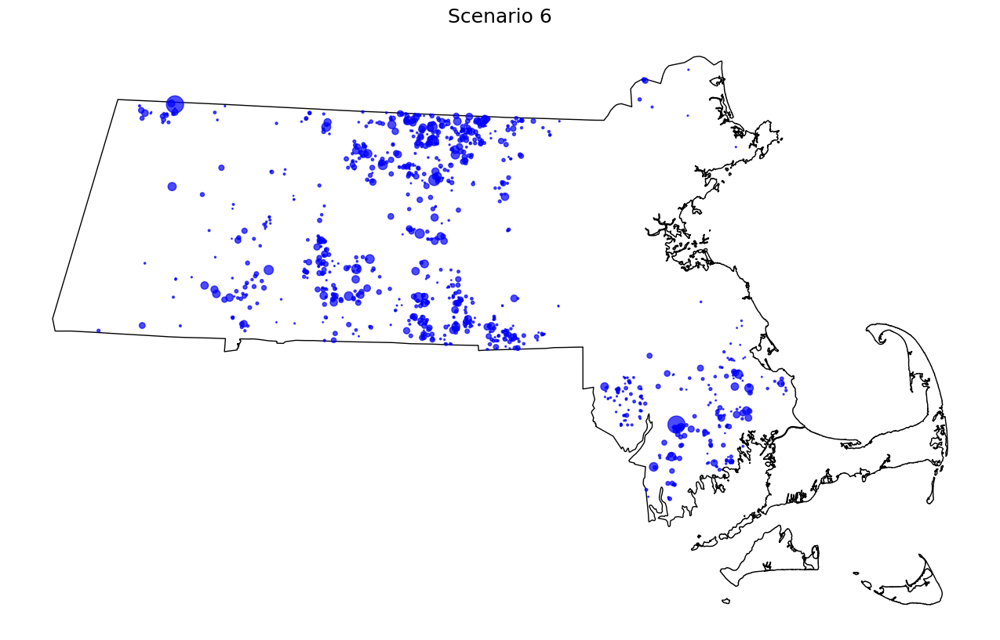

In [85]:
fig6, ax6 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax6, color='none', edgecolor='black')
selected_parcels_scenario_6_gdf = shp_c.join(selected_parcels_scenario_6, on='pid')
selected_parcels_scenario_6_gdf.plot(ax=ax6, markersize='ha', color='blue', alpha=0.7)
ax6.axis('off')
ax6.set_title("Scenario 6", fontsize=18)
#plt.savefig("/Users/andywang/desktop/2_selected_parcels_scenario_6.png", dpi=200)

In [86]:
'''
Carbon offset projects are based on counterfactual thinking
'''

'\nCarbon offset projects are based on counterfactual thinking\n'

In [87]:
dm.head()

,fips,csd_id,ha,slope,travel,p_wet,coast_2500,river_frontage,lake_frontage,lake_importance,...,ce_cost_pred_usd,ce_cost_$/tco2,offer3,offer4,tc,tc+ce_cost_pred_usd,tc+ce_cost_$/tco2,ce_cost_pred_usd_sum_with_transaction,ls_pred_wta,wta_ce_cost_pred_usd
pid,,,,,,,,,,,,,,,,,,,,,
F_803174_3027860,25009,16250,1.138,3.269,8.0,0.0,0.000,0.0,0.0,0.0,...,176858.824298,1520.470734,1402.9264,4769.057131,45000,221858.824298,1907.339658,2.218588e+05,13.264706,262416.453974
M_238118_942044,25009,27620,3.052,6.315,14.0,10.0,0.000,0.0,0.0,0.0,...,236460.045368,460.755421,7933.9792,21041.232312,45000,281460.045368,548.440400,5.033189e+05,12.033875,205536.951893
M_240445_943056,25009,27620,2.165,2.538,20.0,48.0,0.000,0.0,0.0,0.0,...,271186.029362,1886.960249,3423.2980,5892.348399,45000,316186.029362,2200.078191,8.195049e+05,12.478441,227423.866295
M_245474_951109,25009,77150,2.162,1.784,19.0,21.0,7.000,0.0,0.0,0.0,...,144460.400012,inf,0.0000,0.000000,45000,189460.400012,inf,1.008965e+06,12.129188,160160.366651
F_778757_3113679,25009,29405,7.070,7.645,8.0,4.0,4.133,0.0,0.0,0.0,...,106602.697769,153.650451,18758.1240,28445.804035,45000,151602.697769,218.510632,1.160568e+06,10.710491,126761.272814


In [90]:
# Scenario 1: Optimal Allocation
dm_opt = dm.sort_values(by='ce_cost_$/tco2')
dm_opt['ce_cost_pred_usd_sum'] = dm_opt['ce_cost_pred_usd'].cumsum()
i_scenario_opt = dm_opt['ce_cost_pred_usd_sum'].lt(BUDGET*0.8)
selected_parcels_opt = dm_opt[i_scenario_opt]

# Calculating the outcomes for Scenario 1
scenario_opt_results = {
    'n': len(selected_parcels_opt),
    'ha_pc': selected_parcels_opt['ha'].sum(),
    'ha_loss_avo': selected_parcels_opt['ha_f_loss_pred_100yr'].sum(),
    'tco2_avo': selected_parcels_opt['tco2_loss_pred_100yr'].sum(),
    'budget': selected_parcels_opt['ce_cost_pred_usd'].sum(),
    'avg_usd_tco2': selected_parcels_opt['ce_cost_pred_usd'].sum() / selected_parcels_scenario_1['tco2_loss_pred_100yr'].sum()
}

# Scenario 2: Panic Buying
dm_panic = dm[dm['p_f_2010'] > 0].sort_values(by='fc_pred')
dm_panic['ce_cost_pred_usd_sum'] = dm_panic['ce_cost_pred_usd'].cumsum()
i_scenario_panic = dm_panic['ce_cost_pred_usd_sum'].lt(BUDGET*0.2)
selected_parcels_scenario_panic = dm_sorted2[i_scenario_panic]

# Calculating the outcomes for Scenario 2
scenario_panic_results = {
    'n': len(selected_parcels_scenario_panic),
    'ha_pc': selected_parcels_scenario_panic['ha'].sum(),
    'ha_loss_avo': selected_parcels_scenario_panic['ha_f_loss_pred_100yr'].sum(),
    'tco2_avo': selected_parcels_scenario_panic['tco2_loss_pred_100yr'].sum(),
    'budget': selected_parcels_scenario_panic['ce_cost_pred_usd'].sum(),
    'avg_usd_tco2': selected_parcels_scenario_panic['ce_cost_pred_usd'].sum() / selected_parcels_scenario_panic['tco2_loss_pred_100yr'].sum()
}
scenario_panic_results
#scenario_df.to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False)

#pd.DataFrame([scenario_6_values]).to_csv("/Users/andywang/desktop/2_carbon_prices_summary.csv", index=False, mode='a', header=False)

{'n': 9,
 'ha_pc': 53.827,
 'ha_loss_avo': 7.3386,
 'tco2_avo': 2935.4399999999996,
 'budget': 13500891.525943596,
 'avg_usd_tco2': 4599.273541937017}

In [92]:
dm['tax_offer'] = dm['acq_cost_pred_usd'] * 0.5
dm['tax_offer'] = dm['tax_offer'].clip(upper=75000)

In [102]:
dm['flatrate'] = dm['p_f_2010']/100 * dm['ha'] * 1210
i_scenario_tax = dm['tax_offer'] < dm['flatrate']

print(dm[i_scenario_tax]['flatrate'].sum())
selected_parcels_scenario_tax = dm[i_scenario_tax]

68928753.8709


In [103]:
n_scenario_tax = len(selected_parcels_scenario_tax)
ha_pc_scenario_tax = selected_parcels_scenario_tax['ha'].sum()
ha_loss_avo_scenario_tax = selected_parcels_scenario_tax['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_tax = selected_parcels_scenario_tax['tco2_loss_pred_100yr'].sum()
budget_scenario_tax = dm[i_scenario_tax]['flatrate'].sum()
avg_usd_tco2_scenario_tax = budget_scenario_tax / tco2_avo_scenario_tax
scenario_tax_values = {
    'Scenario': 'Scenario Tax Offer',
    'n': n_scenario_tax,
    'ha_pc': ha_pc_scenario_tax,
    'ha_loss_avo': ha_loss_avo_scenario_tax,
    'tco2_avo': tco2_avo_scenario_tax,
    'budget': budget_scenario_tax,
    'avg_usd_tco2': avg_usd_tco2_scenario_tax
}
scenario_tax_values

{'Scenario': 'Scenario Tax Offer',
 'n': 587,
 'ha_pc': 66944.37700000001,
 'ha_loss_avo': 6057.395807710985,
 'tco2_avo': 2422958.323084394,
 'budget': 68928753.8709,
 'avg_usd_tco2': 28.448179737220826}

Text(0.5, 1.0, 'Tax Offer vs Florest Flat Rate')

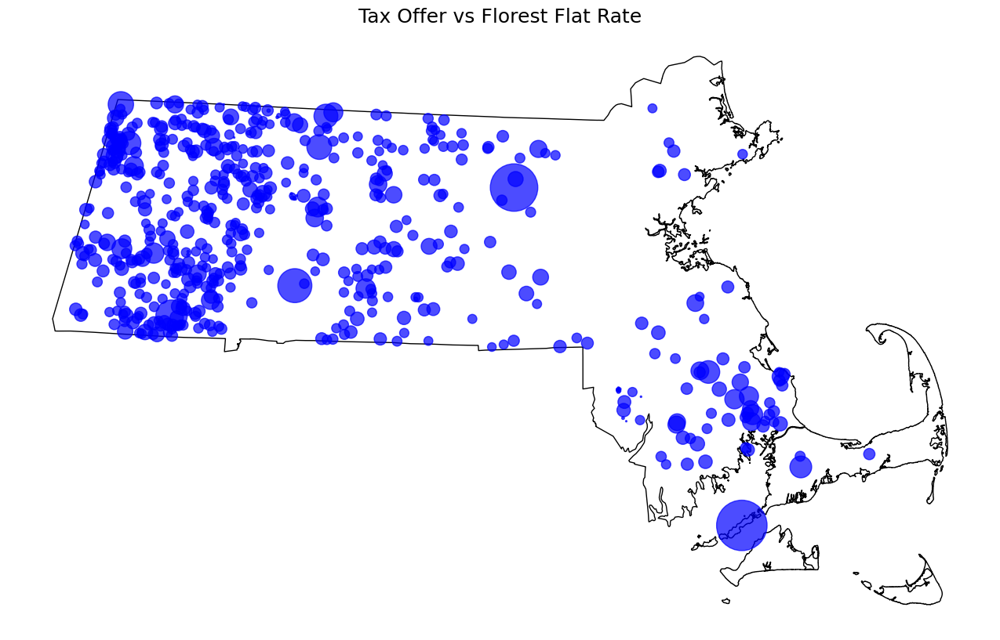

In [118]:
fig, ax10 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax10, color='none', edgecolor='black')
selected_parcels_scenario_tax_gdf = shp_c.join(selected_parcels_scenario_tax, on='pid')
selected_parcels_scenario_tax_gdf.plot(ax=ax10, markersize='ha', color='blue', alpha=0.7)
ax10.axis('off')
ax10.set_title("Tax Offer vs Florest Flat Rate", fontsize=18)

In [112]:
dm['carbonrate']= dm['tco2_loss_pred_100yr'] *13.1
i_scenario_carbonrate = dm['tax_offer'] < dm['carbonrate']
print(dm[i_scenario_carbonrate]['carbonrate'].sum())

69947096.3479845


In [113]:
selected_parcels_scenario_carbonrate = dm[i_scenario_carbonrate]
n_scenario_carbonrate = len(selected_parcels_scenario_carbonrate)
ha_pc_scenario_carbonrate = selected_parcels_scenario_carbonrate['ha'].sum()
ha_loss_avo_scenario_carbonrate = selected_parcels_scenario_carbonrate['ha_f_loss_pred_100yr'].sum()
tco2_avo_scenario_carbonrate = selected_parcels_scenario_carbonrate['tco2_loss_pred_100yr'].sum()
budget_scenario_carbonrate = dm[i_scenario_carbonrate]['carbonrate'].sum()
avg_usd_tco2_scenario_carbonrate = budget_scenario_carbonrate / tco2_avo_scenario_carbonrate
scenario_carbonrate_values = {
    'Scenario': 'Scenario Tax Offer vs Carbon Flat Rate',
    'n': n_scenario_carbonrate,
    'ha_pc': ha_pc_scenario_carbonrate,
    'ha_loss_avo': ha_loss_avo_scenario_carbonrate,
    'tco2_avo': tco2_avo_scenario_carbonrate,
    'budget': budget_scenario_carbonrate,
    'avg_usd_tco2': avg_usd_tco2_scenario_carbonrate
}
scenario_carbonrate_values

{'Scenario': 'Scenario Tax Offer vs Carbon Flat Rate',
 'n': 555,
 'ha_pc': 43257.757,
 'ha_loss_avo': 13348.682509157348,
 'tco2_avo': 5339473.003662939,
 'budget': 69947096.3479845,
 'avg_usd_tco2': 13.099999999999998}

Text(0.5, 1.0, 'Tax Offer vs Carbon Flat Rate')

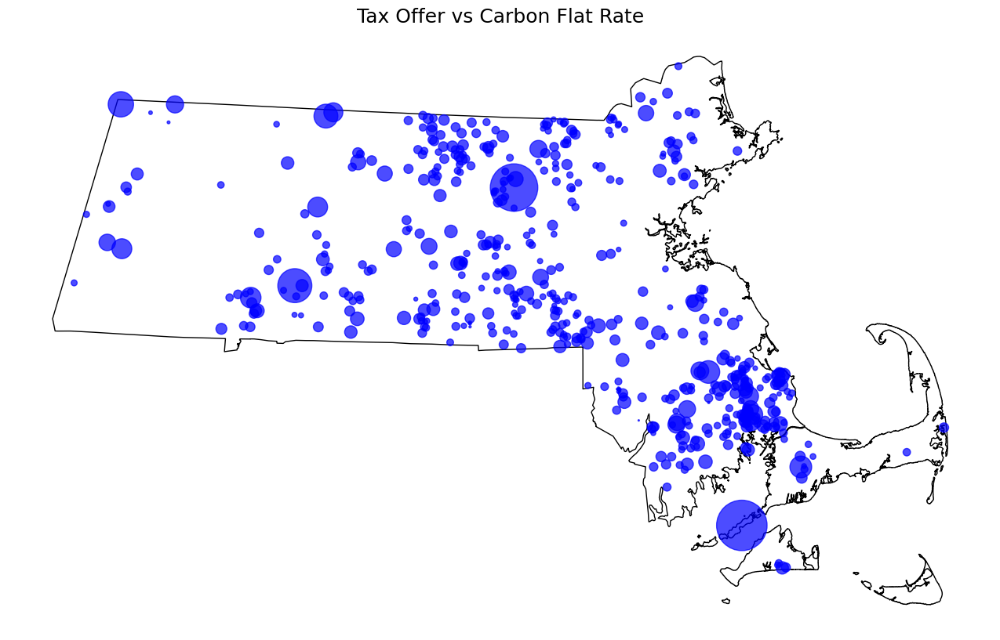

In [119]:
fig, ax11 = plt.subplots(figsize=(17, 10))
shp_ma_outline.plot(ax=ax11, color='none', edgecolor='black')
selected_parcels_scenario_carbonrate_gdf = shp_c.join(selected_parcels_scenario_carbonrate, on='pid')
selected_parcels_scenario_carbonrate_gdf.plot(ax=ax11, markersize='ha', color='blue', alpha=0.7)
ax11.axis('off')
ax11.set_title("Tax Offer vs Carbon Flat Rate", fontsize=18)

In [114]:
dm_sorted_opt = dm.sort_values(by='ce_cost_$/tco2')
dm_sorted_opt['ce_cost_pred_usd_sum'] = dm_sorted_opt['ce_cost_pred_usd'].cumsum()
dm_sorted_pan = dm[dm['p_f_2010'] > 0].sort_values(by='fc_pred')
dm_sorted_pan['ce_cost_pred_usd_sum'] = dm_sorted_pan['ce_cost_pred_usd'].cumsum()

In [122]:
def simulate_allocation(budget_allocation, dm_sorted_opt, dm_sorted_pan, BUDGET):
    """
    Simulates the allocation of budget between the two scenarios and calculates the total CO2 avoided 
    and average cost per tCO2 for the combined allocation.
    """
    # Allocating budget according to the given ratio
    budget_scenario_opt = BUDGET * budget_allocation
    budget_scenario_pan = BUDGET * (1 - budget_allocation)

    # Scenario 1
    i_scenario_opt = dm_sorted_opt['ce_cost_pred_usd_sum'].lt(budget_scenario_opt)
    selected_scenario_opt = dm_sorted_opt[i_scenario_opt]

    # Scenario 2
    i_scenario_pan = dm_sorted_pan['ce_cost_pred_usd_sum'].lt(budget_scenario_pan)
    selected_scenario_pan = dm_sorted_pan[i_scenario_pan]

    # Combined results
    combined_selected = pd.concat([selected_scenario_opt, selected_scenario_pan])
    total_co2_avoided = combined_selected['tco2_loss_pred_100yr'].sum()
    total_budget_used = combined_selected['ce_cost_pred_usd'].sum()
    avg_cost_per_tco2 = total_budget_used / total_co2_avoided if total_co2_avoided > 0 else np.inf

    return total_co2_avoided, avg_cost_per_tco2

allocations = np.arange(0, 1.05, 0.05)  # Allocating from 0% to 100% in 5% increments for Scenario 1
results = [simulate_allocation(allocation, dm_sorted_opt, dm_sorted_pan, BUDGET) for allocation in allocations]

# Pairing results with allocations
results_with_allocations = list(zip(allocations, results))
results_with_allocations

[(0.0, (18688.224000000002, 3661.831554417337)),
 (0.05, (208408.97933571535, 323.76859366971104)),
 (0.1, (349440.7591711177, 199.9041432084736)),
 (0.15000000000000002, (472187.6891205429, 139.24262811426237)),
 (0.2, (590313.2495407679, 117.41693307236335)),
 (0.25, (699898.3108133498, 93.16154606766555)),
 (0.30000000000000004, (803269.6498168104, 85.4234011409276)),
 (0.35000000000000003, (904628.2792642632, 52.2663046392076)),
 (0.4, (1001494.9751070074, 50.588448312530694)),
 (0.45, (1105043.2615579497, 49.196302369869656)),
 (0.5, (1198860.8999801083, 48.22000418811502)),
 (0.55, (1293750.6744031503, 47.432664764532504)),
 (0.6000000000000001, (1380677.2648041507, 46.857144717419835)),
 (0.65, (1472461.0603783657, 46.371398859145835)),
 (0.7000000000000001, (1518150.9516055286, 44.7606240096028)),
 (0.75, (1641723.4929221836, 42.00639230733035)),
 (0.8, (1728889.8029860104, 40.19401911022835)),
 (0.8500000000000001, (1811077.036106914, 37.253067114854645)),
 (0.9, (1893917.2093

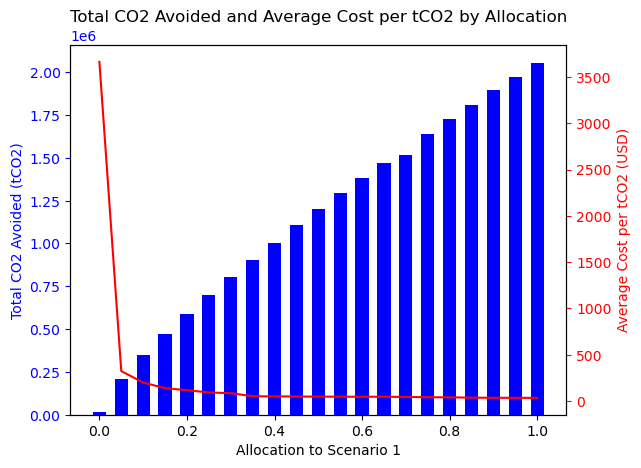

In [123]:
# Extracting total CO2 avoided and average cost per tCO2 for each allocation
total_co2_avoided = [result[0] for _, result in results_with_allocations]
avg_cost_per_tco2 = [result[1] for _, result in results_with_allocations]

# Plotting the results
fig, ax1 = plt.subplots()

# Bar graph for total CO2 avoided
ax1.bar(allocations, total_co2_avoided, width=0.03, color='b', align='center')
ax1.set_xlabel('Allocation to Scenario 1')
ax1.set_ylabel('Total CO2 Avoided (tCO2)', color='b')
ax1.tick_params('y', colors='b')

# Creating a second y-axis for average cost per tCO2
ax2 = ax1.twinx()
ax2.plot(allocations, avg_cost_per_tco2, 'r-')
ax2.set_ylabel('Average Cost per tCO2 (USD)', color='r')
ax2.tick_params('y', colors='r')

plt.title('Total CO2 Avoided and Average Cost per tCO2 by Allocation')
plt.show()

In [185]:
def simulate_allocation2(budget_allocation, dm_sorted_opt, dm_sorted_pan, BUDGET):
    """
    Simulates the allocation of budget between the two scenarios and calculates the total CO2 avoided 
    and average cost per tCO2 for the combined allocation.
    """
    # Allocating budget according to the given ratio
    budget_scenario_opt = BUDGET * budget_allocation
    budget_scenario_pan = BUDGET * (1 - budget_allocation)

    # Scenario 1
    i_scenario_opt = dm_sorted_opt['ce_cost_pred_usd_sum'].lt(budget_scenario_opt)
    selected_scenario_opt = dm_sorted_opt[i_scenario_opt]

    # Scenario 2
    i_scenario_pan = dm_sorted_pan['ce_cost_pred_usd_sum'].lt(budget_scenario_pan)
    selected_scenario_pan = dm_sorted_pan[i_scenario_pan]

    # Combined results
    combined_selected = pd.concat([selected_scenario_opt, selected_scenario_pan])
    total_co2_avoided = (selected_scenario_opt['tco2_loss_pred_100yr'].sum()) + ((selected_scenario_pan['tco2_loss_pred_100yr']*15).sum())
    total_budget_used = combined_selected['ce_cost_pred_usd'].sum()
    avg_cost_per_tco2 = total_budget_used / total_co2_avoided if total_co2_avoided > 0 else np.inf

    return total_co2_avoided, avg_cost_per_tco2

allocations = np.arange(0, 1.05, 0.001)  # Allocating from 0% to 100% in 5% increments for Scenario 1
results2 = [simulate_allocation2(allocation, dm_sorted_opt, dm_sorted_pan, BUDGET) for allocation in allocations]

# Pairing results with allocations
results_with_allocations2 = list(zip(allocations, results2))
results_with_allocations2

[(0.0, (280323.36000000004, 244.12210362782247)),
 (0.001, (288713.8439679416, 237.26656636083797)),
 (0.002, (294996.2639833978, 232.4384172849466)),
 (0.003, (300596.9815912618, 228.32142810910585)),
 (0.004, (300596.9815912618, 228.32142810910585)),
 (0.005, (309825.13321610674, 221.88929843743156)),
 (0.006, (316876.0957418652, 217.24652185580013)),
 (0.007, (316876.0957418652, 217.24652185580013)),
 (0.008, (327729.0138672049, 210.51490343465036)),
 (0.009000000000000001, (331758.5987963735, 208.13088225289147)),
 (0.01, (331758.5987963735, 208.13088225289147)),
 (0.011, (341425.6867963736, 202.6468853055562)),
 (0.012, (344588.328306393, 200.9237092670085)),
 (0.013000000000000001, (349668.3489565756, 198.22663018346896)),
 (0.014, (355837.8782911397, 195.06133766776333)),
 (0.015, (359600.0045853751, 193.1934664265863)),
 (0.016, (363904.37898900127, 191.109884838842)),
 (0.017, (367960.4945795689, 189.1992477427866)),
 (0.018000000000000002, (369517.31664440315, 188.47967546312

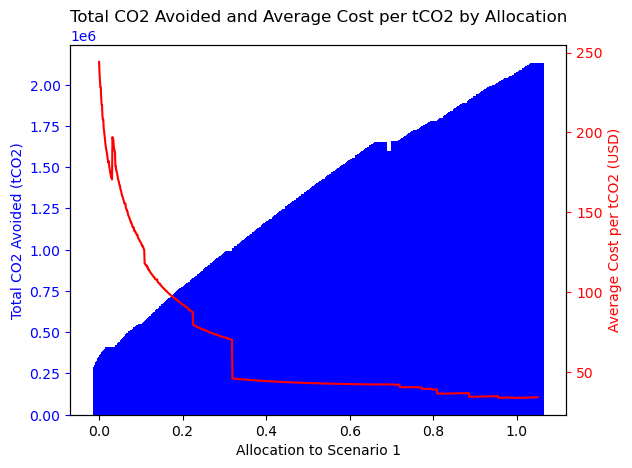

In [186]:
# Extracting total CO2 avoided and average cost per tCO2 for each allocation
total_co2_avoided2 = [result[0] for _, result in results_with_allocations2]
avg_cost_per_tco22 = [result[1] for _, result in results_with_allocations2]

# Plotting the results
fig, ax12 = plt.subplots()

# Bar graph for total CO2 avoided
ax12.bar(allocations, total_co2_avoided2, width=0.03, color='b', align='center')
ax12.set_xlabel('Allocation to Scenario 1')
ax12.set_ylabel('Total CO2 Avoided (tCO2)', color='b')
ax12.tick_params('y', colors='b')

# Creating a second y-axis for average cost per tCO2
ax13 = ax12.twinx()
ax13.plot(allocations, avg_cost_per_tco22, 'r-')
ax13.set_ylabel('Average Cost per tCO2 (USD)', color='r')
ax13.tick_params('y', colors='r')

plt.title('Total CO2 Avoided and Average Cost per tCO2 by Allocation')
plt.show()

In [156]:
dm['tax_offer'] = dm['acq_cost_pred_usd'] * 0.5
dm['tax_offer'] = dm['tax_offer'].clip(upper=75000)
dm['flatrate'] = dm['p_f_2010']/100 * dm['ha'] * 1210
i_scenario_for = dm['tax_offer'] < dm['flatrate']
selected_parcels_scenario_for = dm[i_scenario_for]
dm['carbonrate']= dm['tco2_loss_pred_100yr'] *13.1
i_scenario_carbonrate = dm['tax_offer'] < dm['carbonrate']

In [159]:
def simulate_allocation(budget_allocation, dm, BUDGET):
    """
    Simulates the allocation of budget between the two scenarios and calculates the total CO2 avoided 
    and average cost per tCO2 for the combined allocation.
    """
    # Allocating budget according to the given ratio
    budget_scenario_for = BUDGET * budget_allocation
    budget_scenario_car = BUDGET * (1 - budget_allocation)

    # Scenario 1
    i_scenario_for = dm['flatrate'].sum().lt(budget_scenario_for)
    selected_scenario_for = dm[i_scenario_for]

    # Scenario 2
    i_scenario_car = i_scenario_carbonrate['carbonrate'].sum().lt(budget_scenario_car)
    selected_scenario_car = dm[i_scenario_car]

    # Combined results
    combined_selected = pd.concat([selected_scenario_for, selected_scenario_car])
    total_co2_avoided = combined_selected['tco2_loss_pred_100yr'].sum()
    total_budget_used = combined_selected['ce_cost_pred_usd'].sum()
    avg_cost_per_tco2 = total_budget_used / total_co2_avoided if total_co2_avoided > 0 else np.inf

    return total_co2_avoided, avg_cost_per_tco2

allocations = np.arange(0, 1.05, 0.05)  # Allocating from 0% to 100% in 5% increments for Scenario 1
results3 = [simulate_allocation(allocation, dm, BUDGET) for allocation in allocations]

# Pairing results with allocations
results_with_allocations3 = list(zip(allocations, results))
results_with_allocations3

KeyError: 'flatrate'